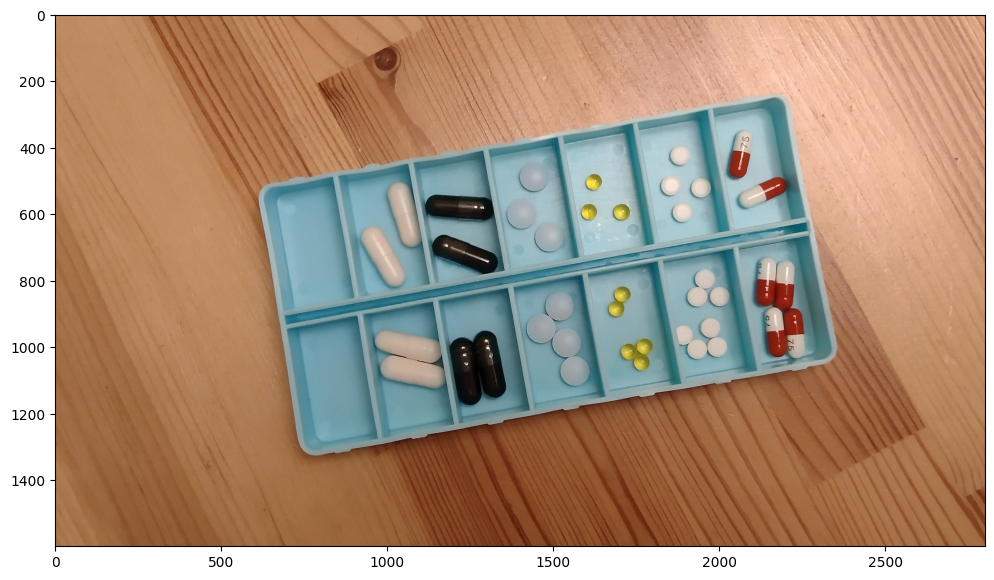

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from enum import Enum
from typing import Any, List


class PillType(Enum):
    PROBIO = 1  # duże białe kapsułki
    CARBON = 2  # duże czarne kapsułki
    KETO = 3  # niebieskie tabletki
    ESPU = 4  # małe żółte kapsułki
    BIOX = 5  # małe białe tabletki
    LINE = 6  # czerwono-białe kapsułki (klasa trudna - realizacja opcjonalna)




calib = cv2.imread("./Lab5_dane/calib.png")
plt.subplots(1, 1, figsize=(12, 8))[1].imshow(calib[..., ::-1])

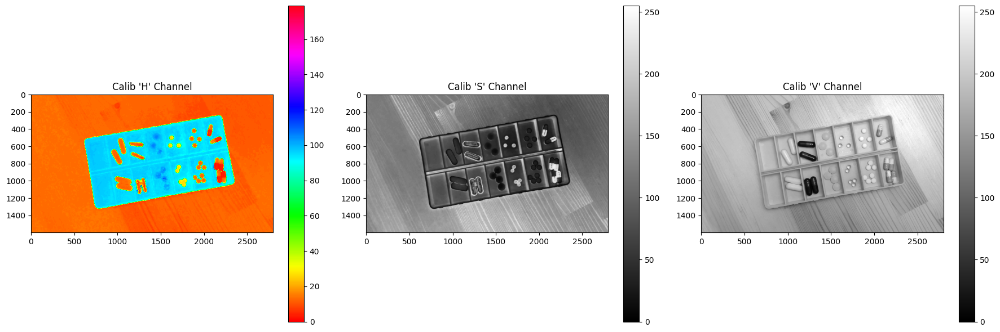

In [3]:
# Convert the calib image to HSV color space
calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)

# Extract the H, S, and V channels
calib_hue = calib_hsv[:, :, 0]
calib_saturation = calib_hsv[:, :, 1]
calib_value = calib_hsv[:, :, 2]

# Display the H, S, and V channels
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(calib_hue, cmap='hsv')
plt.title("Calib 'H' Channel")
plt.colorbar()

plt.subplot(132)
plt.imshow(calib_saturation, cmap='gray')
plt.title("Calib 'S' Channel")
plt.colorbar()

plt.subplot(133)
plt.imshow(calib_value, cmap='gray')
plt.title("Calib 'V' Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

LINE


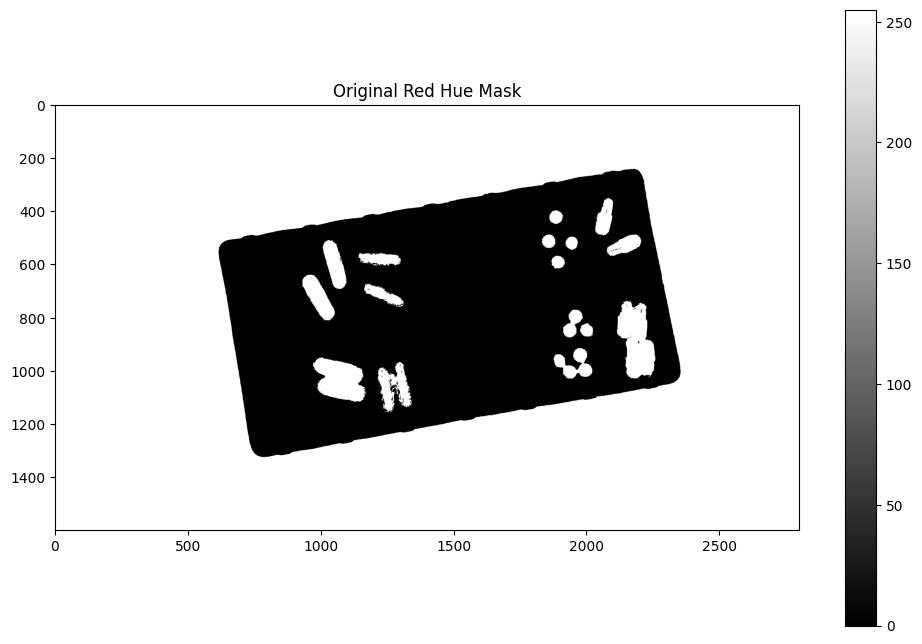

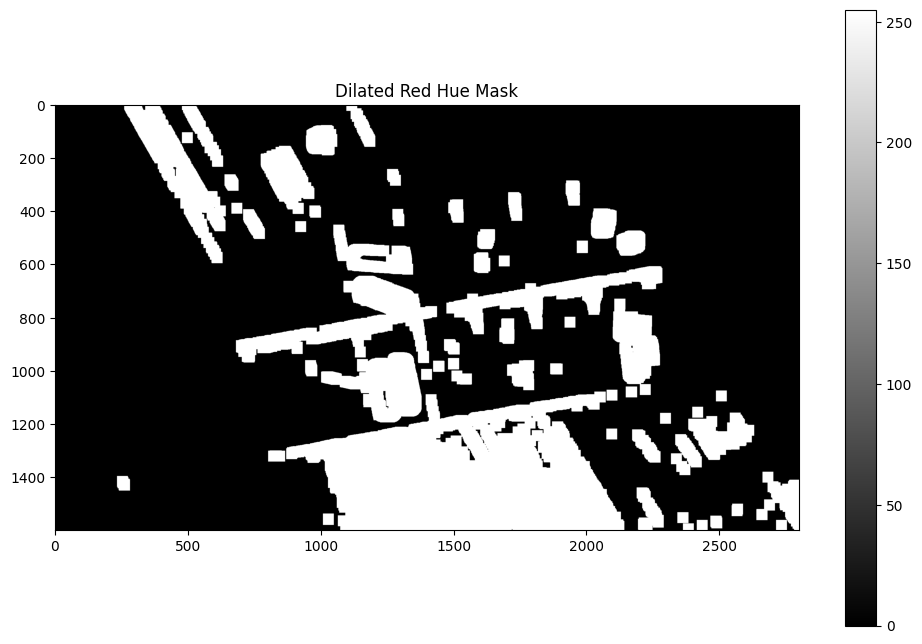

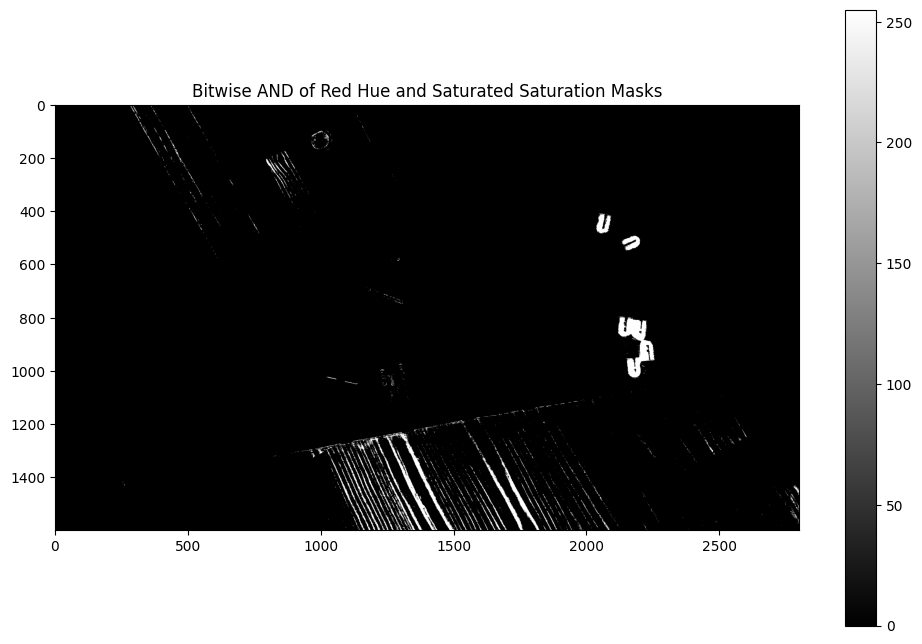

<Figure size 640x480 with 0 Axes>

In [41]:
# Define the hue range for red color
lower_red_hue = 0
upper_red_hue = 20

# Create a binary mask for hue values in the red range
red_hue_mask = cv2.inRange(calib_hue, lower_red_hue, upper_red_hue)


saturated_sat_mask = cv2.inRange(calib_saturation, 200, 255)
# Define the kernel for dilation
dilation_kernel = np.ones((5, 5), np.uint8)

# Apply dilation to the mask
dilated_saturated_sat_mask = cv2.dilate(
    saturated_sat_mask, dilation_kernel, iterations=10
)

# Display the original and dilated masks
plt.figure(figsize=(12, 8))
plt.imshow(red_hue_mask, cmap='gray')
plt.title("Original Red Hue Mask")
plt.colorbar()
plt.show()

plt.figure(figsize=(12, 8))
plt.imshow(dilated_saturated_sat_mask, cmap="gray")
plt.title("Dilated Red Hue Mask")
plt.colorbar()
plt.show()
# show bitwise and
plt.figure(figsize=(12, 8))
plt.imshow(cv2.bitwise_and(red_hue_mask, saturated_sat_mask), cmap='gray')
plt.title("Bitwise AND of Red Hue and Saturated Saturation Masks")
plt.colorbar()
plt.show()

plt.tight_layout()
plt.show()

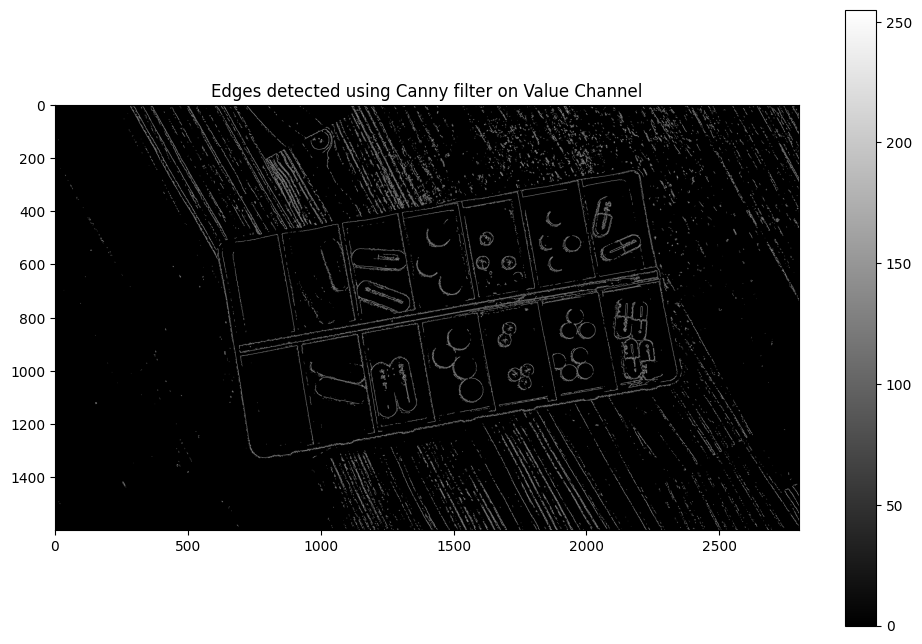

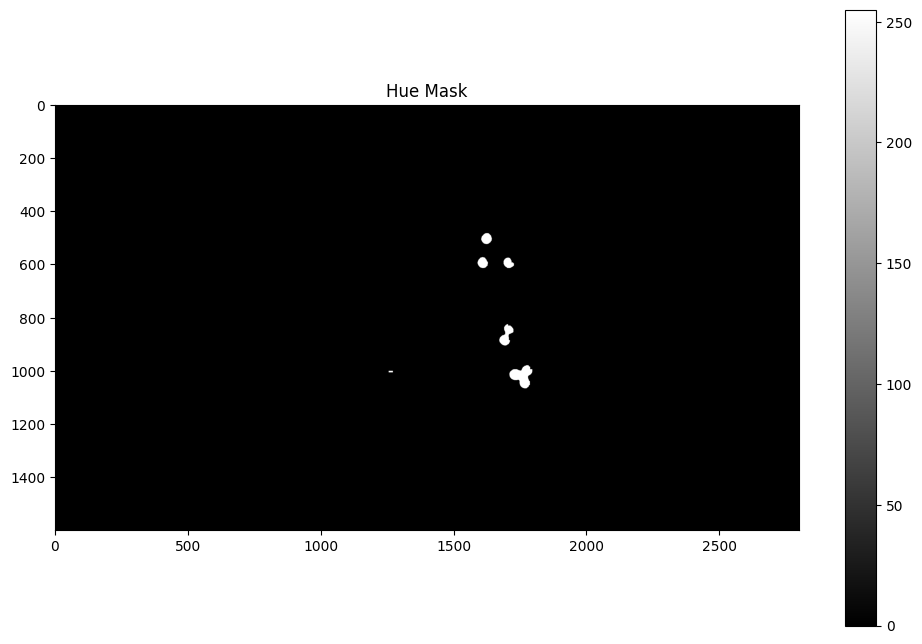

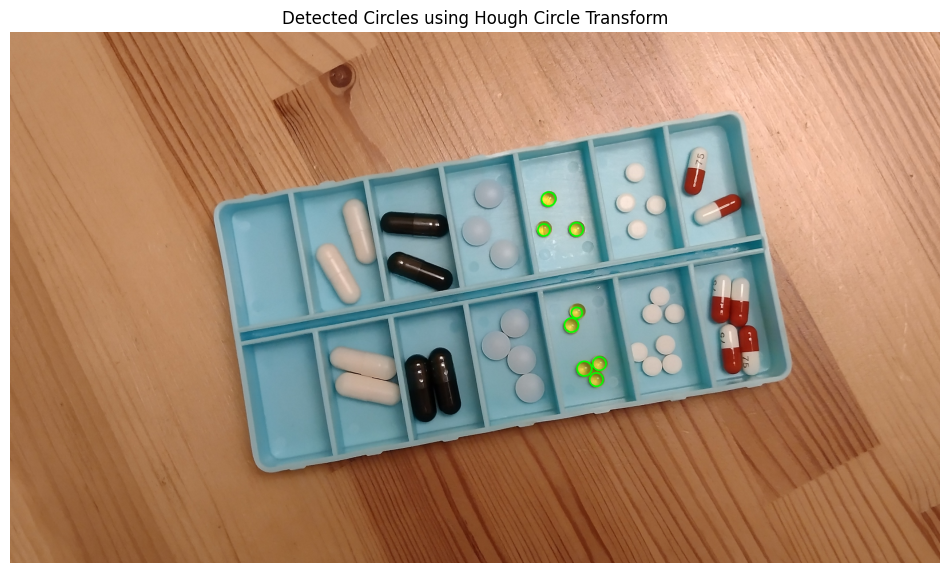

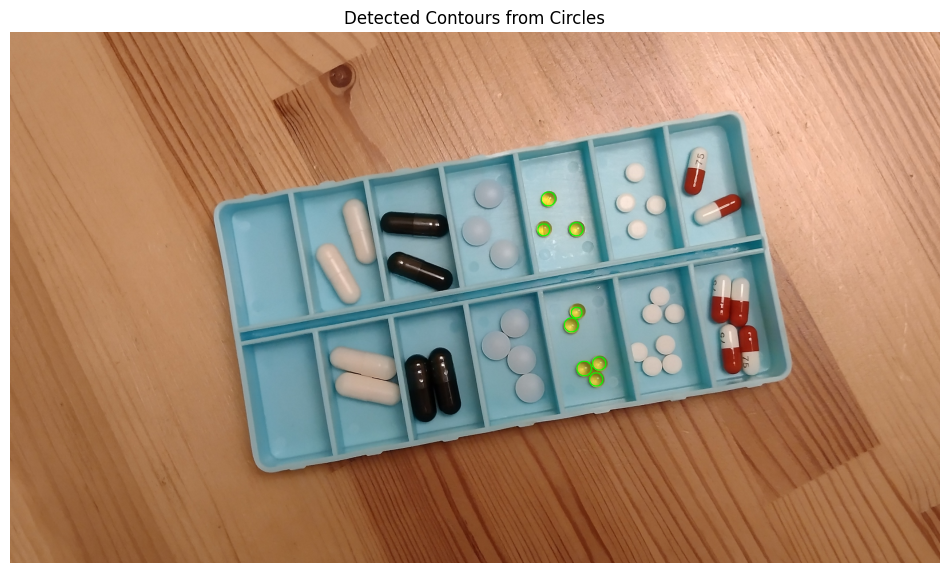

In [35]:
test = cv2.imread("./Lab5_dane/test.png")
calib = cv2.imread("./Lab5_dane/calib.png")
test_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
# Extract the value channel from the HSV image
calib_value = test_hsv[:, :, 2]
calib_hue = test_hsv[:, :, 0]

# Apply Canny edge detection to the value channel
edges_value = cv2.Canny(calib_value, 80, 90)

# Display the edges detected in the value channel
plt.figure(figsize=(12, 8))
plt.imshow(edges_value, cmap='gray')
plt.title("Edges detected using Canny filter on Value Channel")
plt.colorbar()
plt.show()

# Define the hue range for the mask
lower_bound = 22
upper_bound = 30

# Create a binary mask for hue values between 25 and 29
hue_mask = cv2.inRange(calib_hue, lower_bound, upper_bound)

# dilate the mask
# erode the mask
# dilate the mask


kernel = np.ones((5,5), np.uint8)

hue_mask = cv2.erode(hue_mask, kernel, iterations=2)

hue_mask = cv2.dilate(hue_mask, kernel, iterations=1)

plt.figure(figsize=(12, 8))
plt.imshow(hue_mask, cmap='gray')
plt.title("Hue Mask")
plt.colorbar()
plt.show()

# Apply bitwise AND operation with the edges
result = hue_mask

# Perform Hough Circle Transform
circles = cv2.HoughCircles(result, cv2.HOUGH_GRADIENT, dp=1.5, minDist=20, param1=50, param2=15, minRadius=8, maxRadius=30)

# If some circles are detected, draw them on the original image
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    output = calib.copy()
    for (x, y, r) in circles:
        cv2.circle(output, (x, y), r, (0, 255, 0), 4)

    # Display the output image with detected circles
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    plt.title("Detected Circles using Hough Circle Transform")
    plt.axis("off")
    plt.show()
else:
    print("No circles were detected")

# Transform circles to contours
circle_contours = []
if circles is not None:
    for (x, y, r) in circles:
        circle_contour = np.array([[x + r * np.cos(theta), y + r * np.sin(theta)] for theta in np.linspace(0, 2 * np.pi, 100)], dtype=np.int32)
        circle_contours.append(circle_contour)

# Draw the contours on the original image
output_contours = calib.copy()
cv2.drawContours(output_contours, circle_contours, -1, (0, 255, 0), 2)

# Display the output image with detected contours
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(output_contours, cv2.COLOR_BGR2RGB))
plt.title("Detected Contours from Circles")
plt.axis("off")
plt.show()

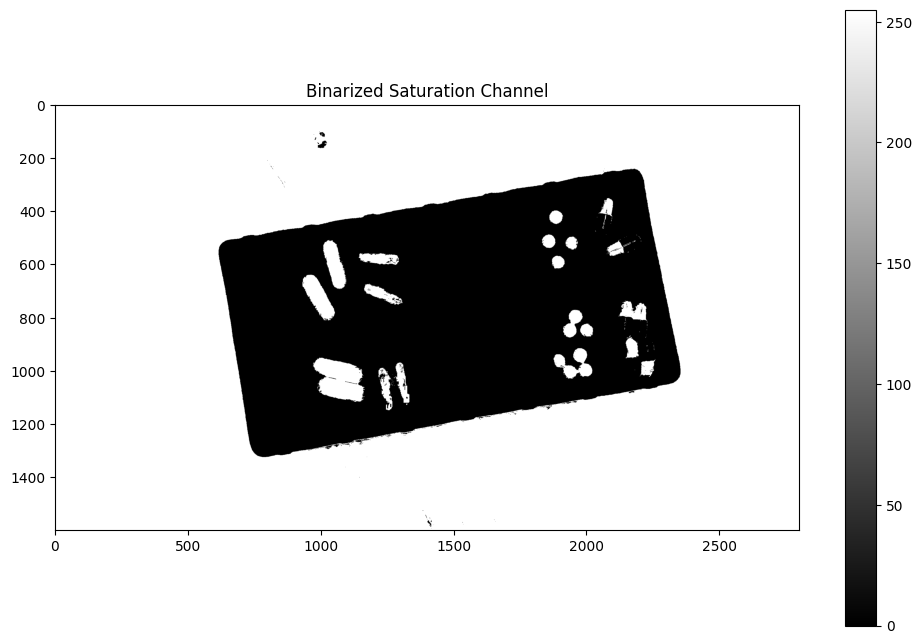

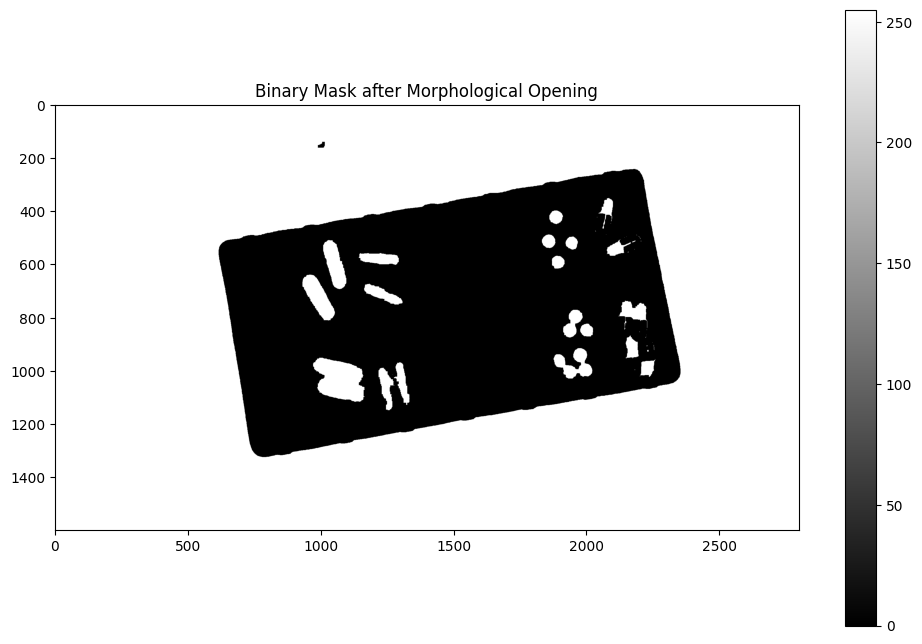

In [40]:
# Define the lower and upper bounds for the saturation channel
lower_bound = 8
upper_bound = 18

# Create a binary mask for saturation values between the lower and upper bounds
binary_mask_saturation = cv2.inRange(calib_hue, lower_bound, upper_bound)

# Display the binary mask
plt.figure(figsize=(12, 8))
plt.imshow(binary_mask_saturation, cmap='gray')
plt.title("Binarized Saturation Channel")
plt.colorbar()
plt.show()

# Apply morphological opening to the binary mask
kernel = np.ones((9, 9), np.uint8)
binary_mask_saturation_opened = cv2.morphologyEx(binary_mask_saturation, cv2.MORPH_CLOSE, kernel)

# Display the result of the morphological opening
plt.figure(figsize=(12, 8))
plt.imshow(binary_mask_saturation_opened, cmap='gray')
plt.title("Binary Mask after Morphological Opening")
plt.colorbar()
plt.show()

Detekcję tabletek organizerze zatem zdefiniowanie czy jest organizacja też nie jest kluczowe zacznijmy od tego

HSV

In [2]:
def show_hsv_histogram(image, main_title="HSV Histogram"):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_image)

    plt.figure(figsize=(12, 6))
    plt.suptitle(main_title)

    plt.subplot(131)
    plt.hist(h.flatten(), bins=180, color="r")
    plt.xlabel("Hue degree")
    plt.ylabel("Frequency")

    plt.title("Hue Histogram")

    plt.subplot(132)
    plt.hist(s.flatten(), bins=256, color="g")
    plt.xlabel("Saturation value")
    plt.ylabel("Frequency")

    plt.title("Saturation Histogram")

    plt.subplot(133)
    plt.hist(v.flatten(), bins=256, color="b", range=[0, 256])
    plt.xlabel("Value")
    plt.title("Value Histogram")

    plt.tight_layout()
    plt.ylabel("Frequency")

    plt.show()


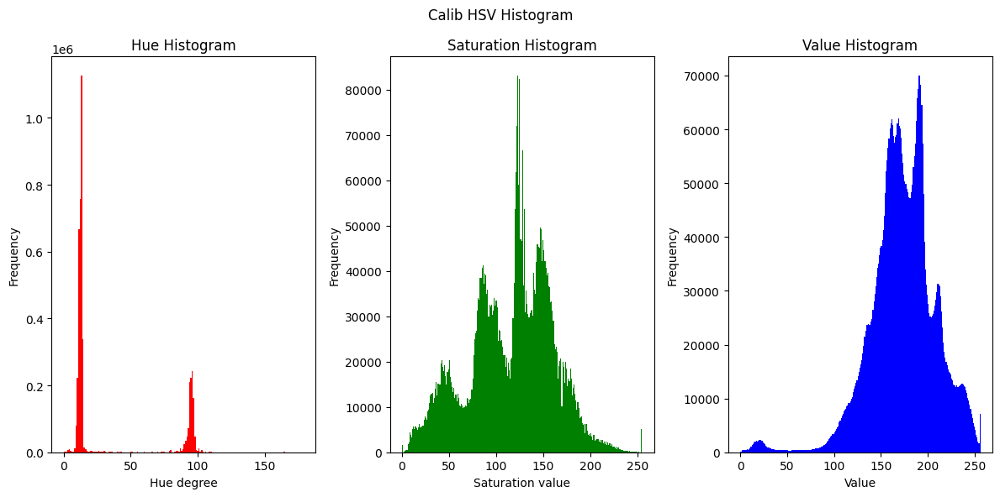

In [3]:
# transform gbr to hsv and show histogram
calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
show_hsv_histogram(calib, "Calib HSV Histogram")

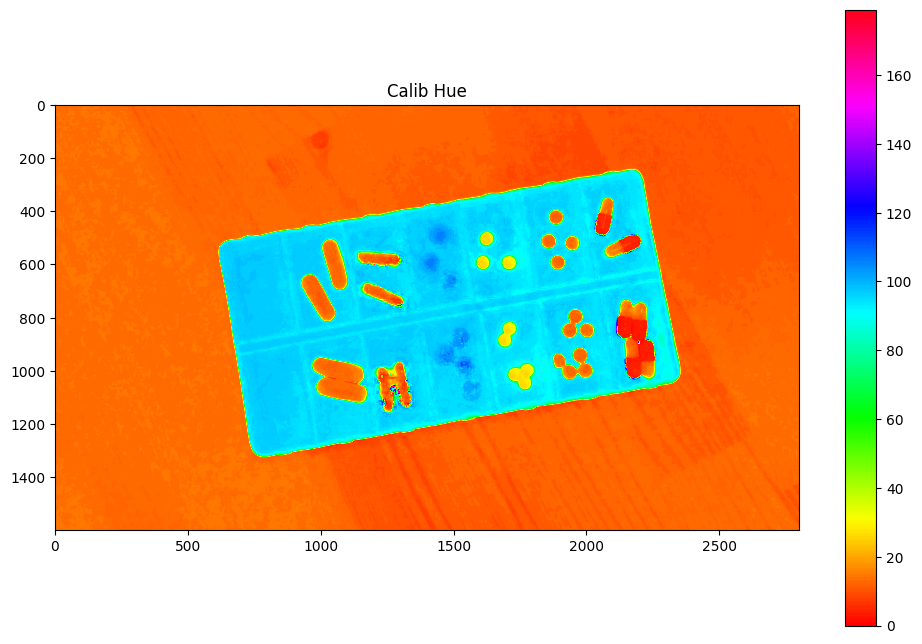

In [190]:
# only show hue from range 50 to 160
calib_hue = calib_hsv[:, :, 0]
plt.figure(figsize=(12, 8))
plt.imshow(calib_hue, cmap="hsv")
plt.title("Calib Hue")
plt.colorbar()
plt.show()

Cielab

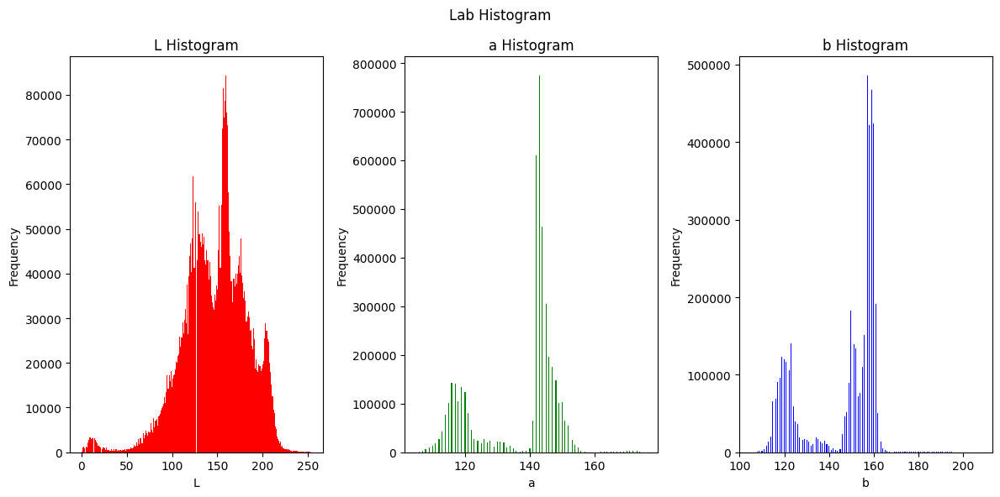

In [5]:
# load calib ro CIE Lab
calib_lab = cv2.cvtColor(calib, cv2.COLOR_BGR2Lab)

# show histogram for Lab
plt.figure(figsize=(12, 6))
plt.suptitle("Lab Histogram")

plt.subplot(131)
plt.hist(calib_lab[..., 0].flatten(), bins=256, color="r")
plt.xlabel("L")
plt.ylabel("Frequency")
plt.title("L Histogram")

plt.subplot(132)
plt.hist(calib_lab[..., 1].flatten(), bins=256, color="g")
plt.xlabel("a")
plt.ylabel("Frequency")
plt.title("a Histogram")

plt.subplot(133)
plt.hist(calib_lab[..., 2].flatten(), bins=256, color="b")
plt.xlabel("b")
plt.ylabel("Frequency")

plt.title("b Histogram")
plt.tight_layout()
plt.show()

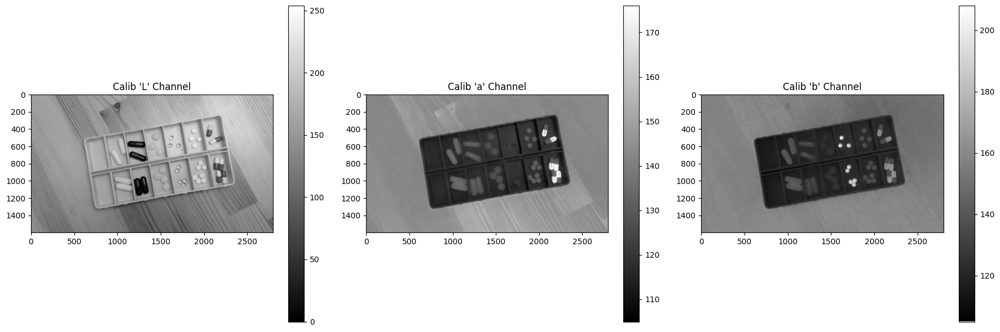

In [6]:
# Extract the 'L', 'a', and 'b' channels from the Lab image
calib_L_channel = calib_lab[..., 0]
calib_a_channel = calib_lab[..., 1]
calib_b_channel = calib_lab[..., 2]

# Display the 'L', 'a', and 'b' channels side by side
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(calib_L_channel, cmap='gray')
plt.title("Calib 'L' Channel")
plt.colorbar()

plt.subplot(1, 3, 2)
plt.imshow(calib_a_channel, cmap='gray')
plt.title("Calib 'a' Channel")
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(calib_b_channel, cmap='gray')
plt.title("Calib 'b' Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

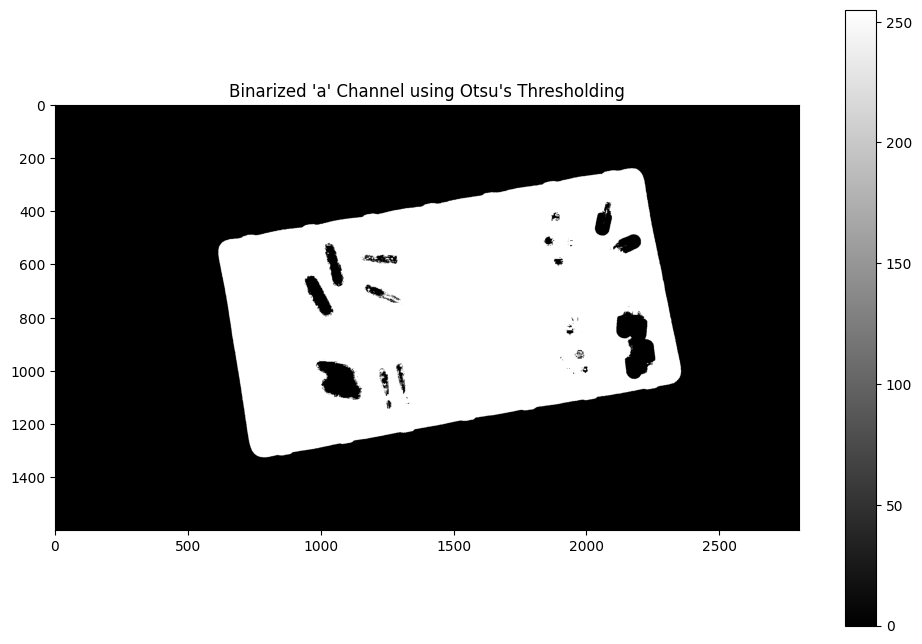

In [7]:
# Apply Otsu's thresholding to the 'a' channel
_, otsu_thresh = cv2.threshold(calib_a_channel, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Display the binarized 'a' channel
plt.figure(figsize=(12, 8))
plt.imshow(otsu_thresh, cmap='gray')
plt.title("Binarized 'a' Channel using Otsu's Thresholding")
plt.colorbar()
plt.show()

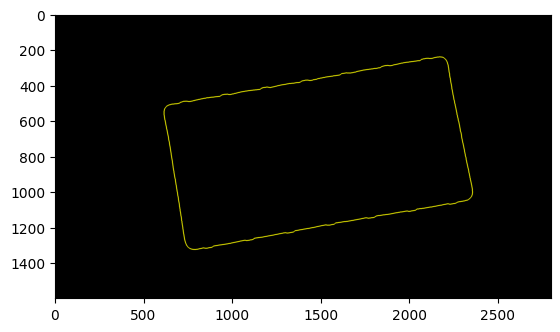

In [8]:
contours, hierarchy = cv2.findContours(
    otsu_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)
display = np.zeros_like(calib)
cv2.drawContours(display, contours, -1, (255, 255, 0), 3)
plt.imshow(display)

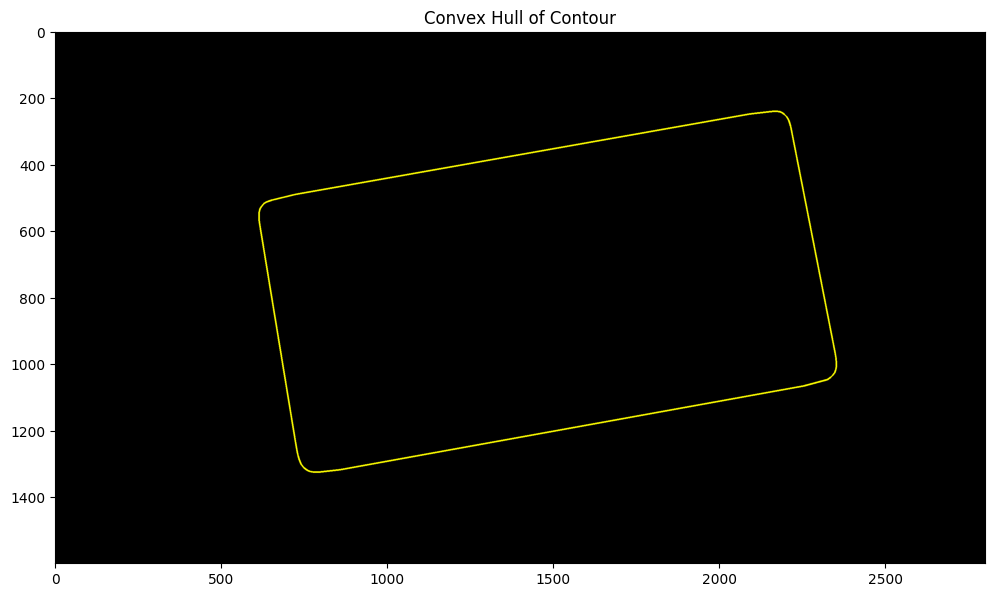

In [9]:
# Create a convex hull of the contour
contour = contours[0]
hull = cv2.convexHull(contour)

# Draw the convex hull on the image
hull_display = np.zeros_like(calib)
cv2.drawContours(hull_display, [hull], -1, (255, 255, 0), 3)

# Display the convex hull
plt.figure(figsize=(12, 8))
plt.imshow(hull_display)
plt.title("Convex Hull of Contour")
plt.show()

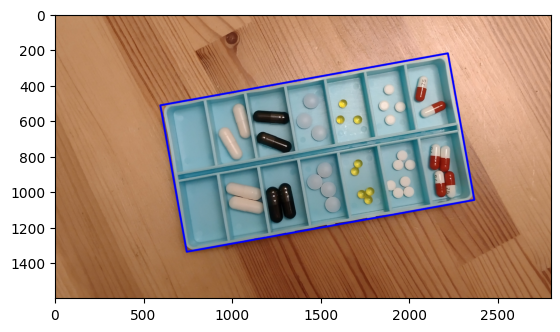

In [10]:
minRect = cv2.minAreaRect(hull)
display = calib.copy()

cv2.drawContours(
    display, [cv2.boxPoints(minRect).astype(np.int32)], 0, color=255, thickness=10
)
plt.imshow(cv2.cvtColor(display, cv2.COLOR_BGR2RGB), cmap="gray", vmax=255)

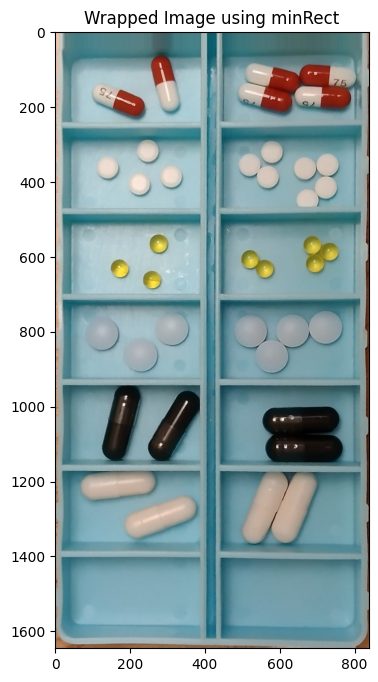

In [55]:
# Get the box points of the minimum area rectangle
box_points = cv2.boxPoints(minRect).astype(np.int32)

# Calculate the width and height of the rectangle
width = int(minRect[1][0])
height = int(minRect[1][1])

# Get the rotation matrix for the rectangle
rotation_matrix = cv2.getRotationMatrix2D(minRect[0], minRect[2], 1.0)

# Rotate the image to align the rectangle with the axes
rotated_image = cv2.warpAffine(calib, rotation_matrix, (calib.shape[1], calib.shape[0]))

# Extract the rectangle from the rotated image
wrapped_image = cv2.getRectSubPix(rotated_image, (width, height), minRect[0])

# Display the wrapped image
plt.figure(figsize=(12, 8))
plt.imshow(wrapped_image[..., ::-1])
plt.title("Wrapped Image using minRect")
plt.show()

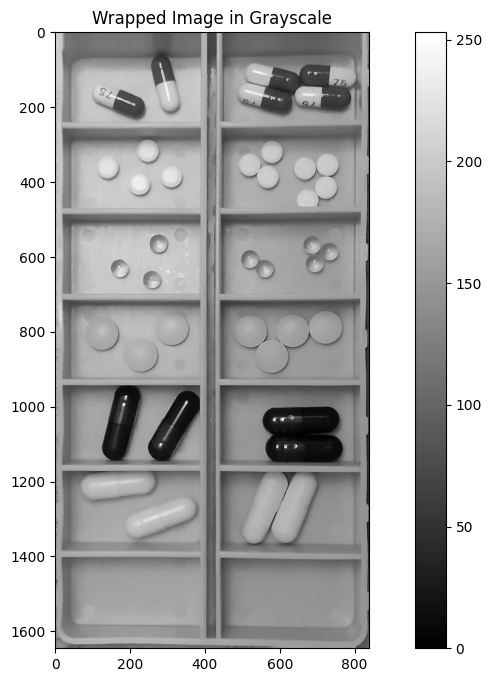

In [12]:
#show wrapped image in grayscale
wrapped_image_gray = cv2.cvtColor(wrapped_image, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(12, 8))
plt.imshow(wrapped_image_gray, cmap="gray")
plt.title("Wrapped Image in Grayscale")
plt.colorbar()
plt.show()

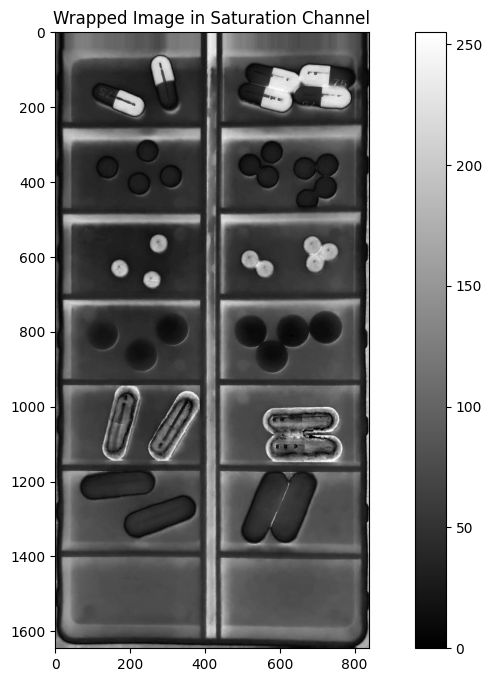

In [35]:
# Convert the wrapped image to HSV color space
wrapped_image_hsv = cv2.cvtColor(wrapped_image, cv2.COLOR_BGR2HSV)

# Extract the saturation channel
wrapped_image_saturation = wrapped_image_hsv[:, :, 1]

# Display the saturation channel
plt.figure(figsize=(12, 8))
plt.imshow(wrapped_image_saturation, cmap='gray')
plt.title("Wrapped Image in Saturation Channel")
plt.colorbar()
plt.show()

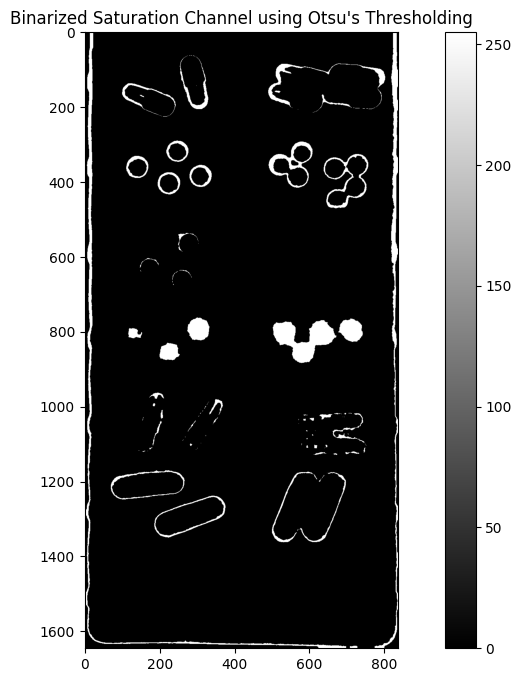

In [70]:
# apply thresholding to saturation channel
_, wrapped_image_saturation_thresh = cv2.threshold(
    wrapped_image_saturation, 20, 255, cv2.THRESH_BINARY_INV
)

# apply morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))
wrapped_image_saturation_thresh = cv2.morphologyEx(
    wrapped_image_saturation_thresh, cv2.MORPH_CLOSE, kernel
)


# Display the binarized saturation channel
plt.figure(figsize=(12, 8))
plt.imshow(wrapped_image_saturation_thresh, cmap='gray')
plt.title("Binarized Saturation Channel using Otsu's Thresholding")
plt.colorbar()
plt.show()


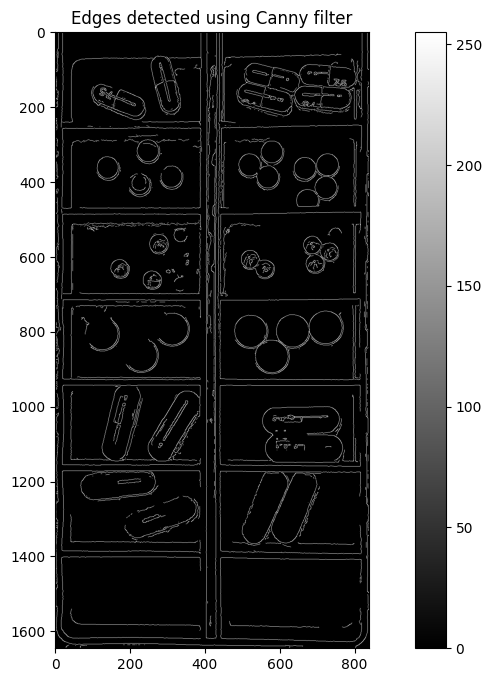

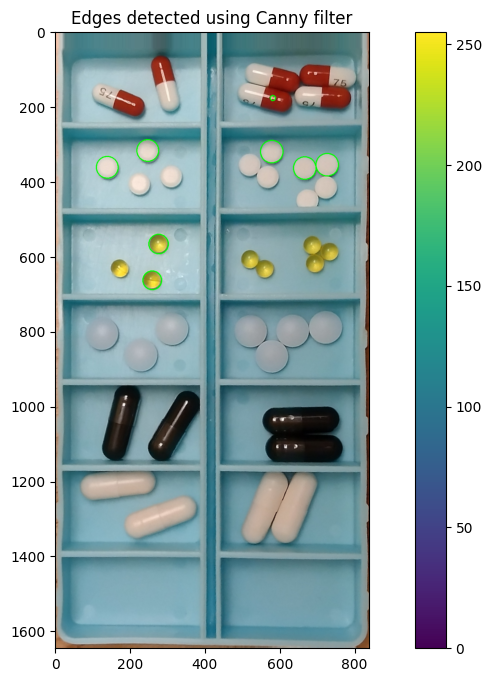

In [77]:
# Apply Canny edge detection
copy = wrapped_image.copy()
blur = cv2.GaussianBlur(copy, (5, 5), 0)
edges = cv2.Canny(blur, 20, 60)

# Display the edges
plt.figure(figsize=(12, 8))
plt.imshow(edges, cmap='gray')
plt.title("Edges detected using Canny filter")
plt.colorbar()
plt.show()

# find contours
contours, hierarchy = cv2.findContours(
    edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)
circles = []
for contour in contours:
    # Approximate the contour
    perimeter = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 0.04 * perimeter, True)

    # Calculate circularity
    area = cv2.contourArea(contour)
    if area == 0:
        continue
    circularity = (4 * np.pi * area) / (perimeter * perimeter)

    # Check if the contour is circular enough and has sufficient area
    if 0.3 < circularity < 2.5 and area > 80:  # Adjust the range and area threshold as needed
        circles.append(contour)

# Draw detected circles on the original image
for contour in circles:
    (x, y), radius = cv2.minEnclosingCircle(contour)
    center = (int(x), int(y))
    radius = int(radius)
    cv2.circle(copy, center, radius, (0, 255, 0), 2)

# Display the edges
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))
plt.title("Edges detected using Canny filter")
plt.colorbar()
plt.show()

# BLACK pills

In [80]:
def black_pill_binarizer(image: np.ndarray, display: bool = False) -> np.ndarray:
    # Convert the image to grayscale
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    image = cv2.GaussianBlur(image, (5, 5), 0)


    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Grayscale Image")
        plt.axis("off")
        plt.show()

    # Apply thresholding
    _, image = cv2.threshold(image, 30, 255, cv2.THRESH_BINARY_INV)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Binarized Image")
        plt.axis("off")
        plt.show()

    # applt dilation
    kernel = np.ones((9, 9), np.uint8)


    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    convex_hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        convex_hulls.append(hull)
    # Fill the contours
    cv2.drawContours(image, convex_hulls, -1, (255, 255, 255), thickness=cv2.FILLED)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Filled Contours")
        plt.axis("off")
        plt.show()

    image = cv2.dilate(image, kernel, iterations=1)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Dilated Image")
        plt.axis("off")
        plt.show()



    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Binarized with edges Image")
        plt.axis("off")
        plt.show()

    # get hue from hsv image
    image_h = image_hsv[:,:,0]

    lower_bound = 8
    upper_bound = 19

    hue_mask = cv2.inRange(image_h, lower_bound, upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(hue_mask, cmap="gray")
        plt.title("Hue Mask")
        plt.axis("off")
        plt.show()

    kernel = np.ones((9, 9), np.uint8)
    hue_mask = cv2.morphologyEx(hue_mask, cv2.MORPH_CLOSE, kernel)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(hue_mask, cmap="gray")
        plt.title("Hue Mask closed")
        plt.axis("off")
        plt.show()

    image = cv2.bitwise_and(image, hue_mask)

    # Apply erosion
    kernel = np.ones((3, 3), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Eroded Image")
        plt.axis("off")
        plt.show()


    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        plt.title("Contours")
        plt.axis("off")
        plt.show()

    # convex hull
    convex_hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        convex_hulls.append(hull)

    # filter convex hulls
    min_area = 200  # Minimum area threshold
    filtered_hulls = [hull for hull in convex_hulls if cv2.contourArea(hull) > min_area]
    convex_hulls = filtered_hulls

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        plt.title("Convex Hulls")
        plt.axis("off")
        plt.show()

    return convex_hulls

Number of black pills detected: 6


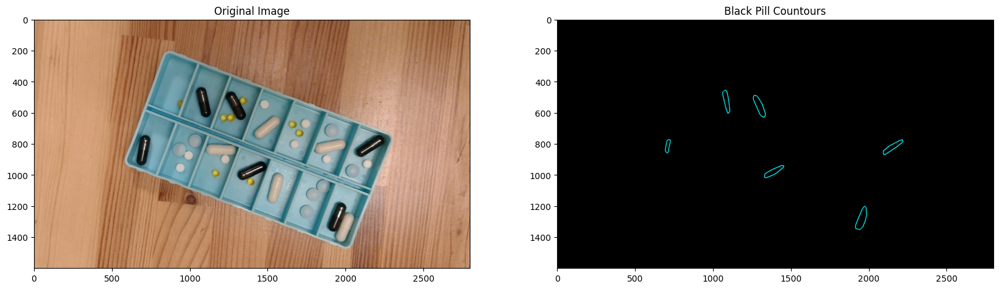

In [82]:
# show result of black pill binarizer
calib = cv2.imread("./Lab5_dane/test.png")
black = np.zeros_like(calib)
black_pill_counturs = black_pill_binarizer(calib, False)
print(f"Number of black pills detected: {len(black_pill_counturs)}")
cv2.drawContours(black, black_pill_counturs, -1, (255, 255, 0), 3)
# show orginial calib image in rgb

fig, ax = plt.subplots(1, 2, figsize=(20, 20))
ax[0].imshow(cv2.cvtColor(calib, cv2.COLOR_BGR2RGB))
ax[0].set_title("Original Image")

ax[1].imshow(cv2.cvtColor(black, cv2.COLOR_BGR2RGB))
ax[1].set_title("Black Pill Countours")

plt.show()

# Yellow pills


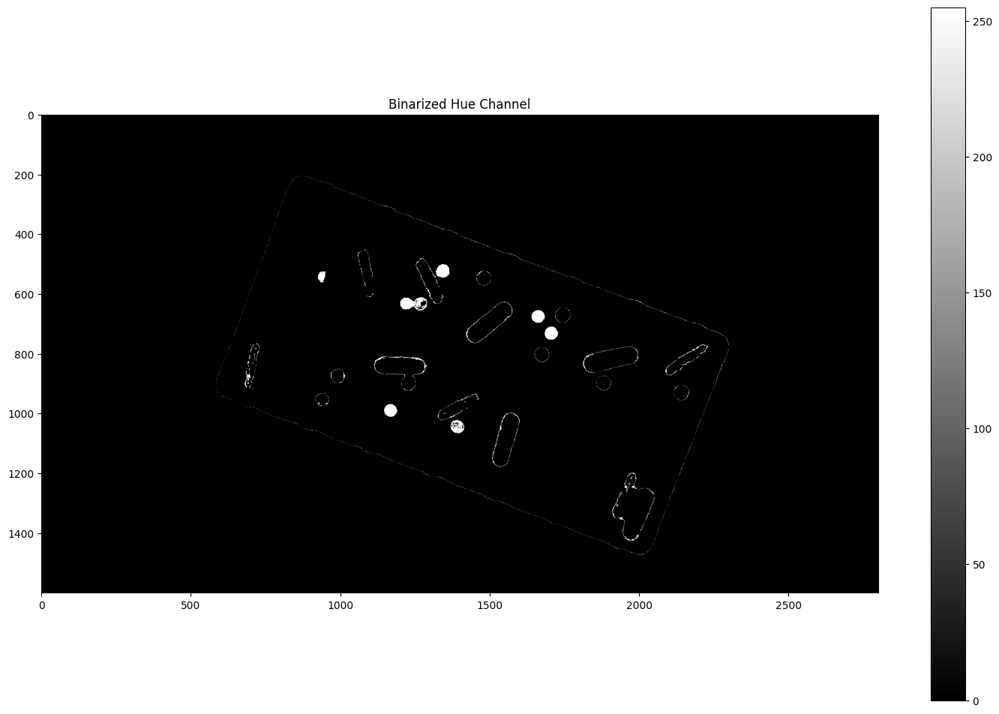

In [29]:
calib_hsv = cv2.cvtColor(test, cv2.COLOR_BGR2HSV)
calib_hue = calib_hsv[:, :, 0]

# Define the hue range for binarization
lower_bound = 25
upper_bound = 30

# Create a binary mask for hue values between 20 and 40
binary_mask = cv2.inRange(calib_hue, lower_bound, upper_bound)

# Plot the binary mask
plt.figure(figsize=(18, 12))
plt.imshow(binary_mask, cmap="gray")
plt.title("Binarized Hue Channel")
plt.colorbar()
plt.show()

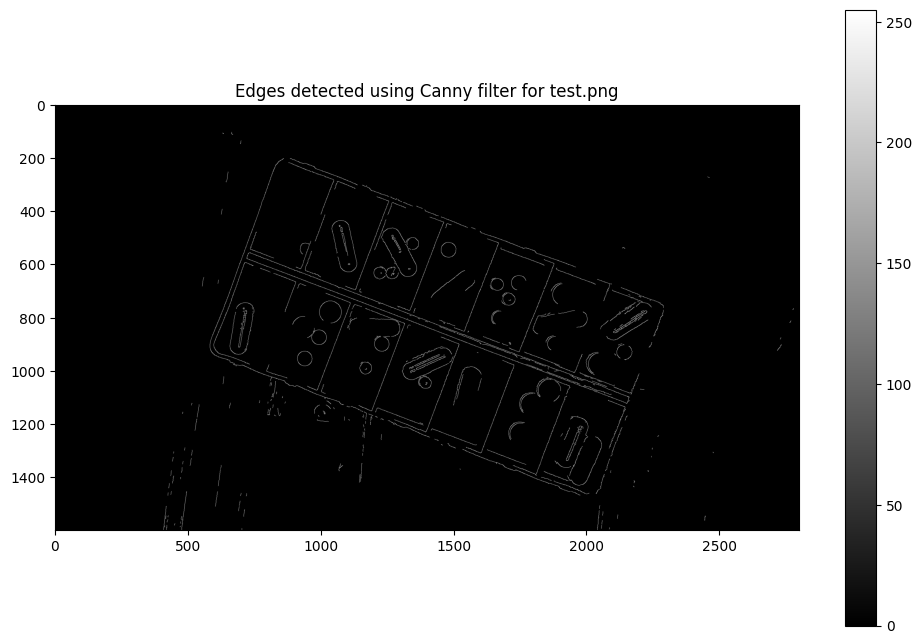

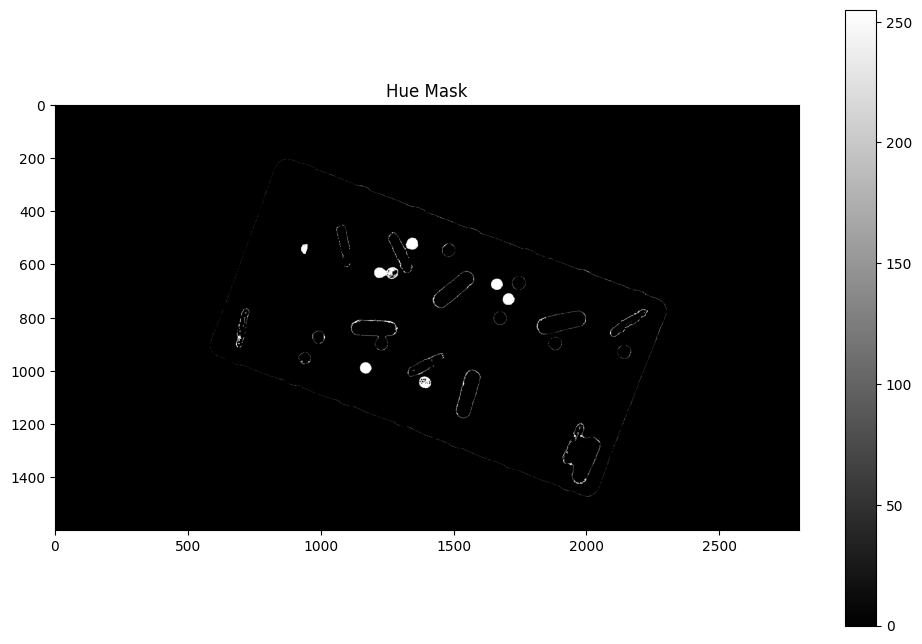

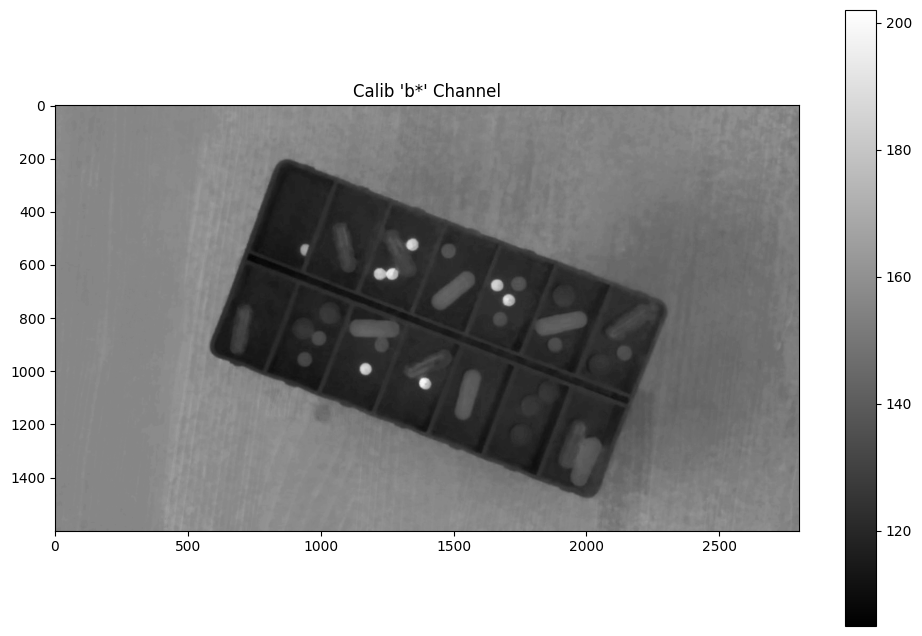

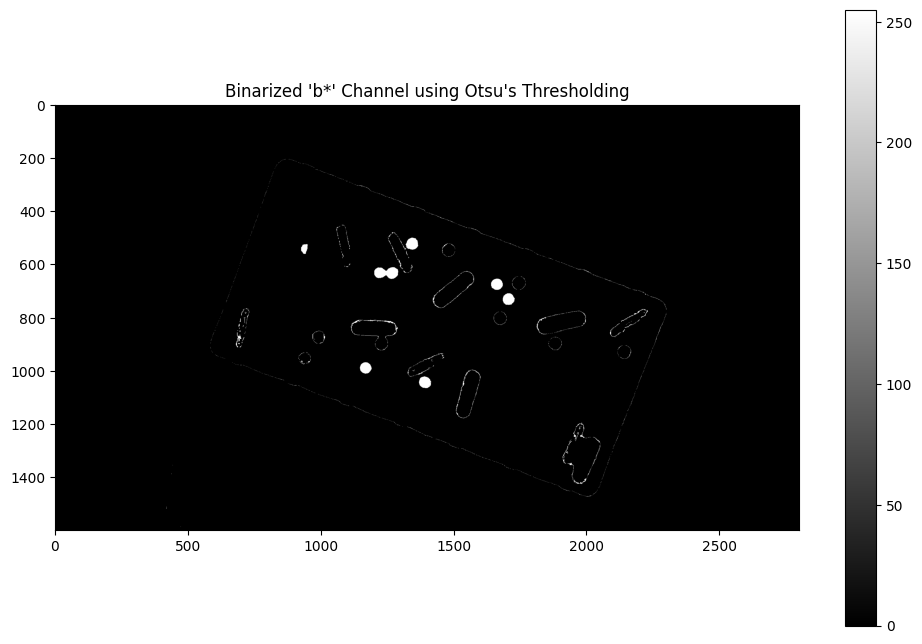

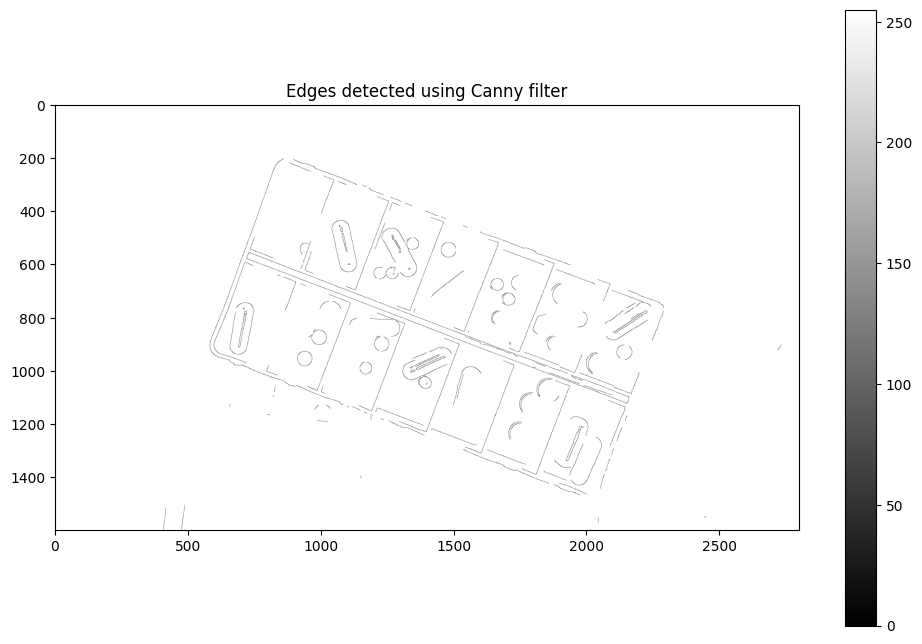

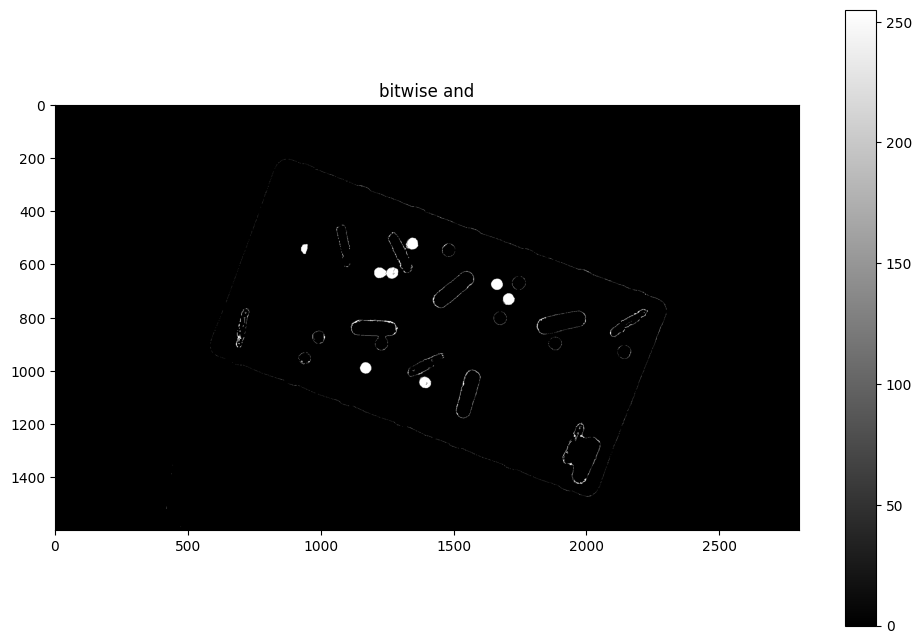

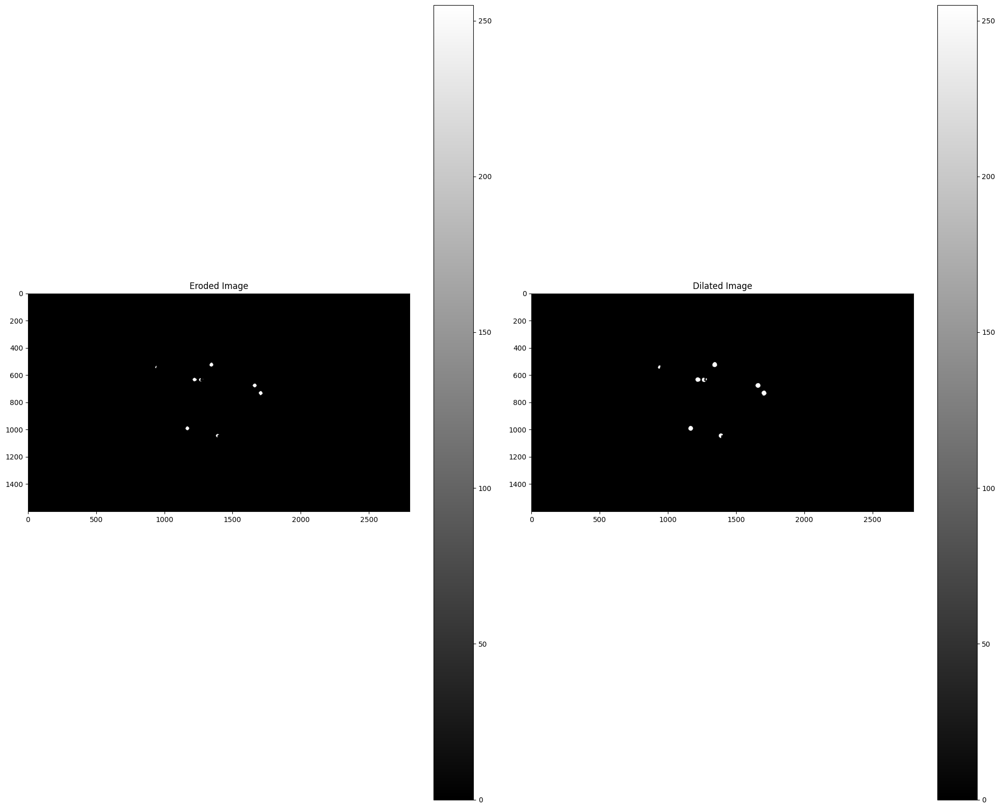

In [36]:
# Display the 'b*' channel from the Lab image
test = cv2.imread("./Lab5_dane/test.png")

blur = cv2.GaussianBlur(test, (7, 7), 0)
edges = cv2.Canny(blur, 100, 150)


calib_hsv = cv2.cvtColor(test, cv2.COLOR_BGR2HSV)
calib_hue = calib_hsv[:, :, 0]

# Define the hue range for binarization
lower_bound = 25
upper_bound = 30

# Create a binary mask for hue values between 20 and 40
test_hue_mask = cv2.inRange(calib_hue, lower_bound, upper_bound)

# show hue mask
plt.figure(figsize=(12, 8))
plt.imshow(test_hue_mask, cmap='gray')
plt.title("Hue Mask")
plt.colorbar()
plt.show()


calib_lab = cv2.cvtColor(test, cv2.COLOR_BGR2Lab)
calib_b_channel = calib_lab[..., 2]

plt.figure(figsize=(12, 8))
plt.imshow(calib_b_channel, cmap='gray')
plt.title("Calib 'b*' Channel")
plt.colorbar()
plt.show()

# Apply Otsu's thresholding to the 'b*' channel
_, otsu_thresh = cv2.threshold(calib_b_channel, 166, 255, cv2.THRESH_BINARY)

# make a bitwise NAND of otsu_thresh and edges
otsu_thresh = cv2.bitwise_or(otsu_thresh, test_hue_mask)

# Display the binarized 'b*' channel
plt.figure(figsize=(12, 8))
plt.imshow(otsu_thresh, cmap='gray')
plt.title("Binarized 'b*' Channel using Otsu's Thresholding")
plt.colorbar()
plt.show()

edges = cv2.bitwise_not(edges)
# show edges
plt.figure(figsize=(12, 8))
plt.imshow(edges, cmap='gray')
plt.title("Edges detected using Canny filter")
plt.colorbar()
plt.show()


otsu_thresh = cv2.bitwise_and(otsu_thresh, edges)
plt.figure(figsize=(12, 8))
plt.imshow(otsu_thresh, cmap="gray")
plt.title("bitwise and")
plt.colorbar()
plt.show()
# use erode and dilate to remove noise

# Apply erosion
kernel = np.ones((7, 7), np.uint8)
eroded_image = cv2.erode(otsu_thresh, kernel, iterations=2)

# Apply dilation
dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)

# Display the eroded and dilated images
plt.figure(figsize=(20, 16))
plt.subplot(121)
plt.imshow(eroded_image, cmap='gray')
plt.title("Eroded Image")
plt.colorbar()

plt.subplot(122)
plt.imshow(dilated_image, cmap='gray')
plt.title("Dilated Image")
plt.colorbar()

plt.tight_layout()
plt.show()

In [163]:
def yellow_pills_binarizer(image: np.ndarray, display: bool = False) -> np.ndarray:

    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # blue organizer hue 90 - 110

    # Extract the hue channel
    hue_channel = image_hsv[..., 0]

    # Define the hue range for binarization
    lower_bound = 90
    upper_bound =110 
    # Create a binary mask for hue values between 90 and 110
    hue_mask = cv2.inRange(hue_channel, lower_bound, upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(hue_mask, cmap='gray')
        plt.title("Hue Mask")
        plt.colorbar()
        plt.show()

    # Find contours
    contours, _ = cv2.findContours(hue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # filter contours by area

    contours = [contour for contour in contours if cv2.contourArea(contour) > 1000]

    print(f"Number of contours detected: {len(contours)}")

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)


    # Convex hull
    convex_hulls = [cv2.convexHull(contour) for contour in contours]

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)


    # all pixels outside the convex hull are set to 0
    mask = np.zeros_like(image)
    cv2.drawContours(mask, convex_hulls, -1, (255, 255, 255), -1)

    image = cv2.bitwise_and(image, mask)

    # print img color model

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image[..., ::-1])
        plt.title("Filtered Image")
        plt.show()

    image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

    # Extract the 'b*' channel from the Lab image
    b_channel = image_lab[..., 2]
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(b_channel, cmap='gray')
        plt.title("B Channel")
        plt.colorbar()
        plt.show()

    # apply thresholding 182
    _, image_b = cv2.threshold(b_channel, 166, 255, cv2.THRESH_BINARY)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image_b, cmap='gray')
        plt.title("Binarized B Channel")
        plt.colorbar()
        plt.show()
    # image_combined = image_b
    # Extract the hue channel

    hue_channel = image_hsv[..., 0]

    # Define the hue range for binarization
    lower_bound = 25
    upper_bound = 29

    # Create a binary mask for hue values between 20 and 40
    hue_mask = cv2.inRange(hue_channel, lower_bound, upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(hue_mask, cmap='gray')
        plt.title("Hue Mask")
        plt.colorbar()
        plt.show()

    # # make a bitwise NAND of otsu_thresh and edges
    image_combined = cv2.bitwise_or(image_b, hue_mask)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image_combined, cmap='gray')
        plt.title("Combined Image")
        plt.colorbar()
        plt.show()

    # Apply erosion
    erosion_kernel = np.ones((7, 7), np.uint8)
    image_combined = cv2.erode(image_combined, erosion_kernel, iterations=1)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image_combined, cmap="gray")
        plt.title("Eroded Image")
        plt.colorbar()
        plt.show()

    # Apply dilation
    dilation_kernel = np.ones((7, 7), np.uint8)
    image_combined = cv2.dilate(image_combined, dilation_kernel, iterations=1)
    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image_combined, cmap="gray")
        plt.title("Dilated Image")
        plt.colorbar()
        plt.show()

    # edges

    blur = cv2.GaussianBlur(image, (5, 5), 0)
    edges = cv2.Canny(blur, 120, 190)

    # perform CLOSE operation on edges
    edges_kernel = np.ones((3, 3), np.uint8)
    edges = cv2.dilate(edges, edges_kernel, iterations=1)

    edges = cv2.bitwise_not(edges)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(edges, cmap='gray')
        plt.title("Edges")
        plt.colorbar()
        plt.show()

    image = cv2.bitwise_and(image_combined, edges)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Final Image")
        plt.colorbar()
        plt.show()

    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        plt.title("Contours")
        plt.colorbar()
        plt.show()

    # convex hull
    convex_hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        convex_hulls.append(hull)

    # filter contours by area
    convex_hulls = [hull for hull in convex_hulls if cv2.contourArea(hull) > 300]

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        plt.title("Convex Hulls")
        plt.colorbar()
        plt.show()

    return convex_hulls

In [2]:
# black pills for calib
def process_pills(img, binarizer_function, title, display=True):
    processed_img = np.zeros_like(img)
    pill_contours = binarizer_function(img, display)
    cv2.drawContours(processed_img, pill_contours, -1, (255, 255, 0), 3)

    # show original and processed images in rgb
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")

    ax[1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
    ax[1].set_title(title + f" - Number of pills detected: {len(pill_contours)}")

    plt.show()
    return processed_img, pill_contours

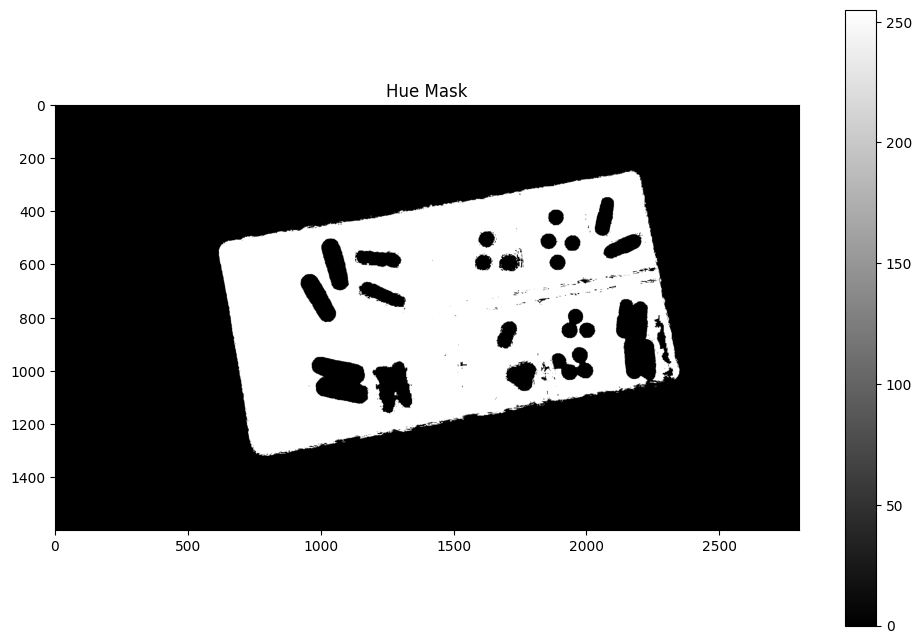

Number of contours detected: 1


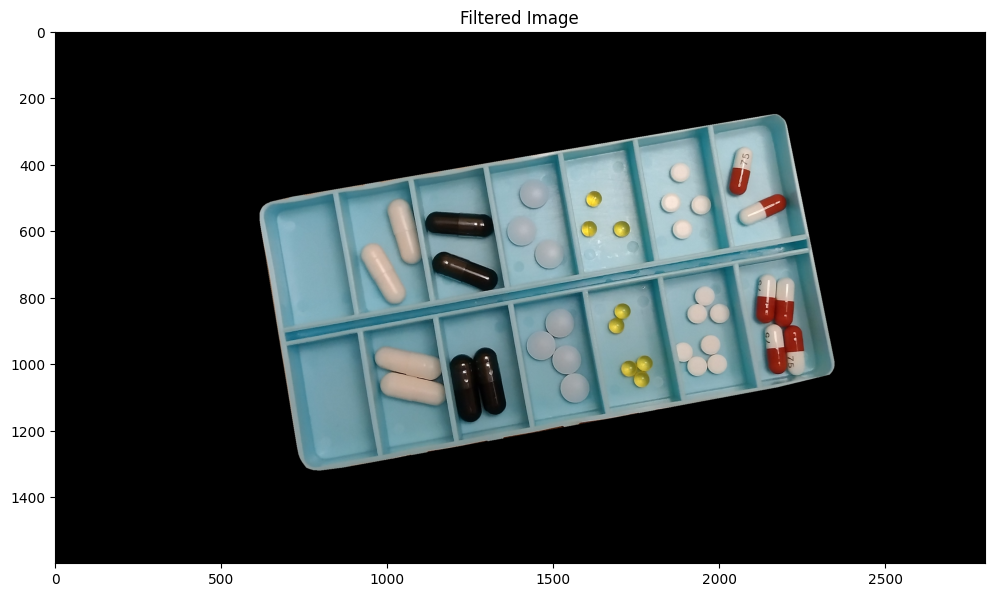

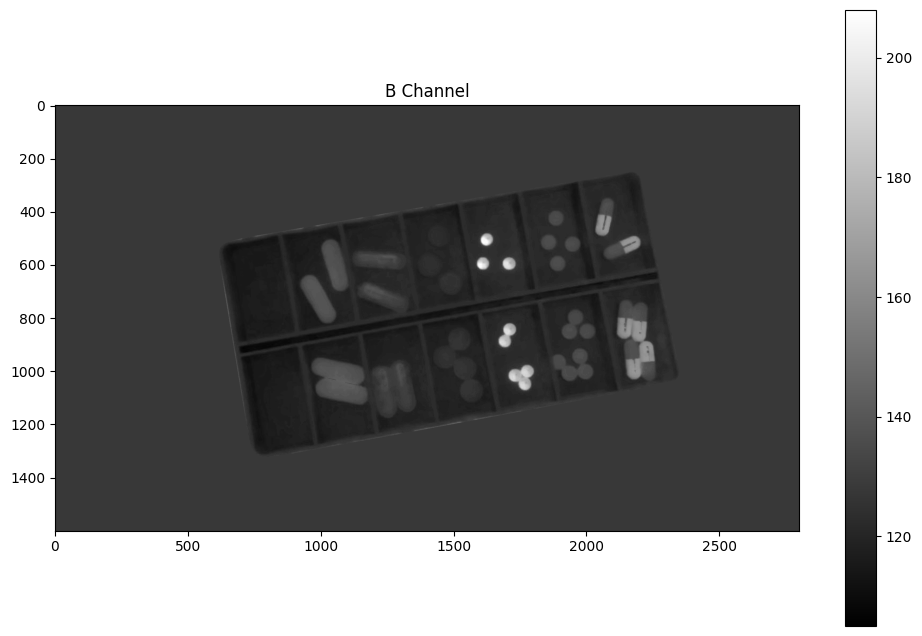

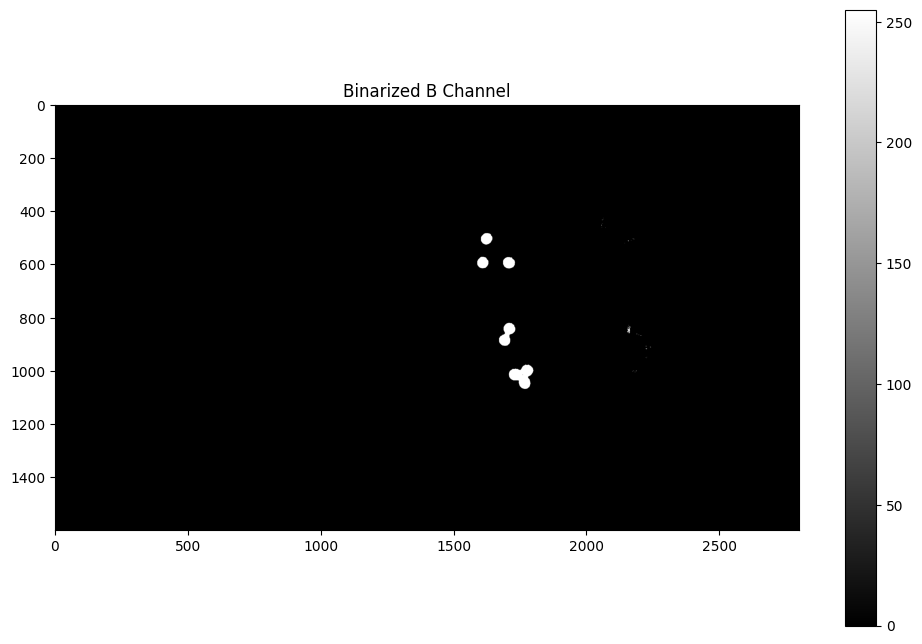

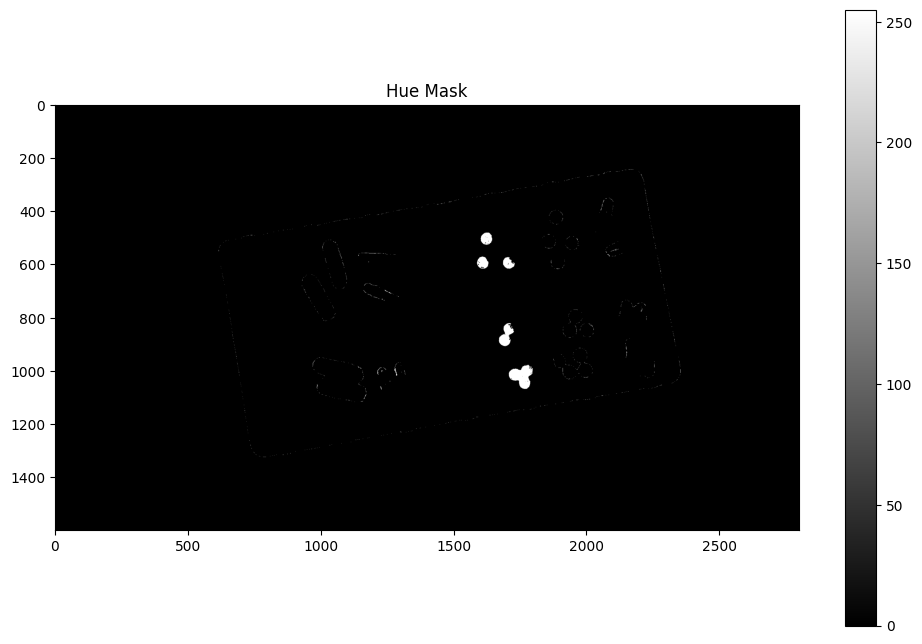

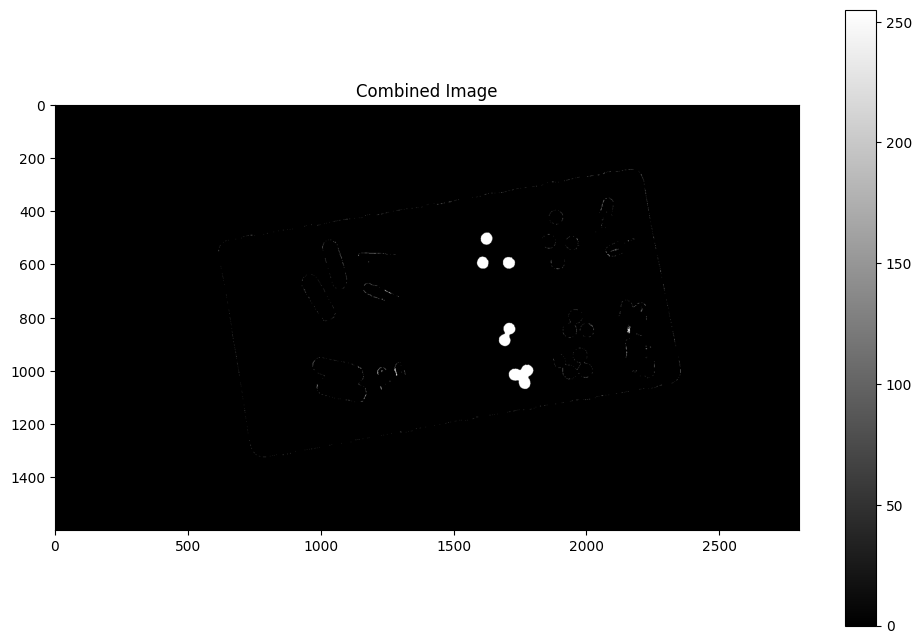

...

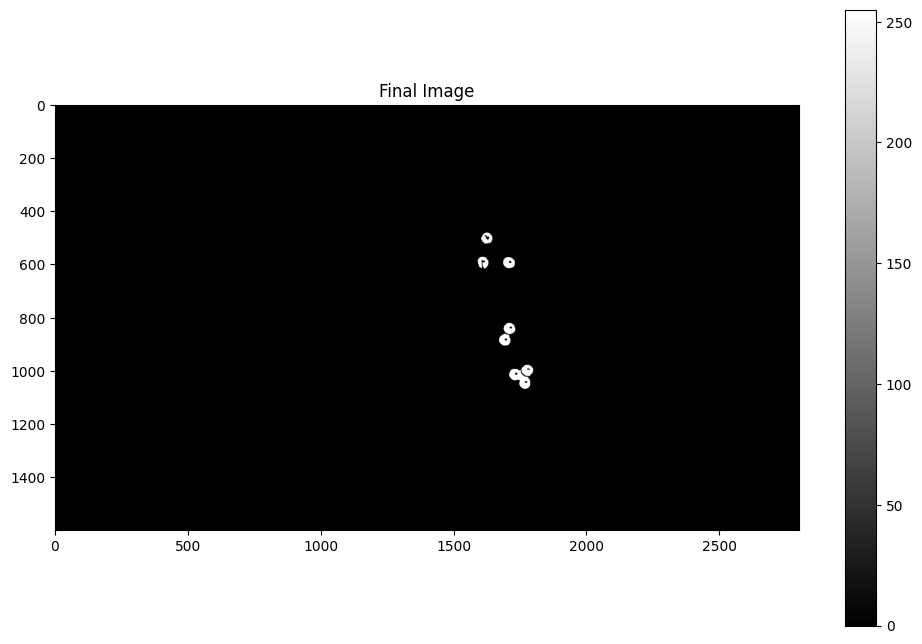

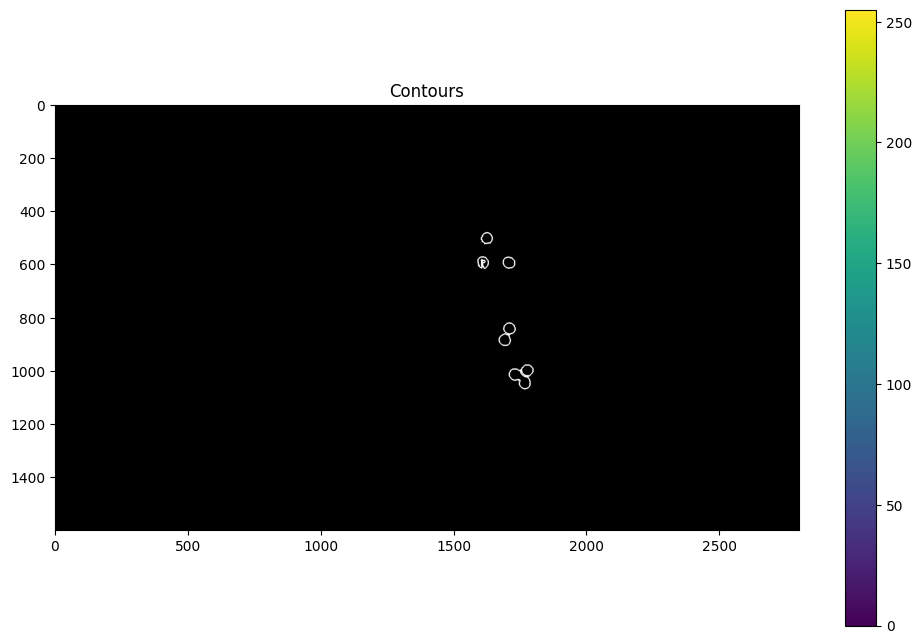

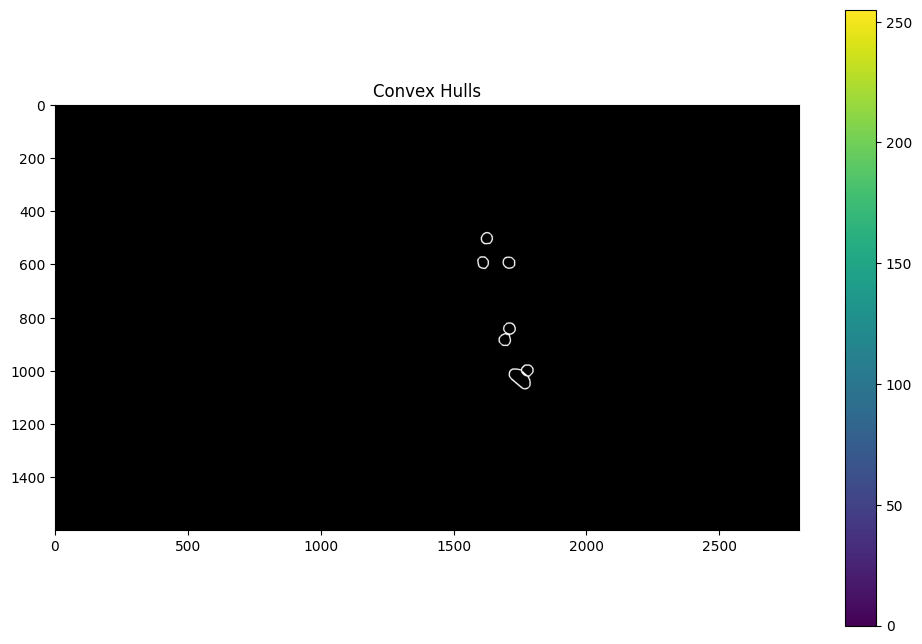

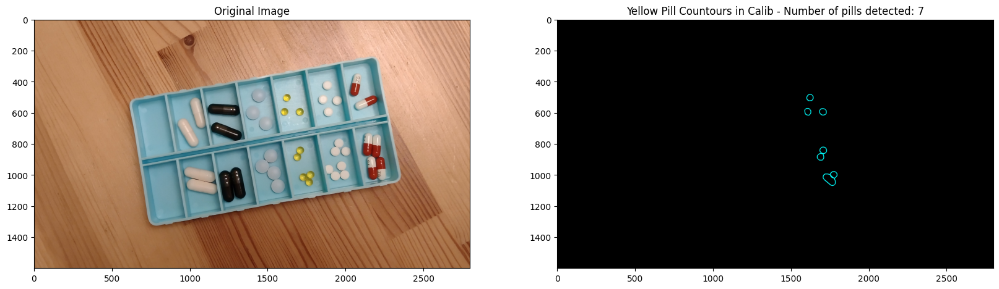

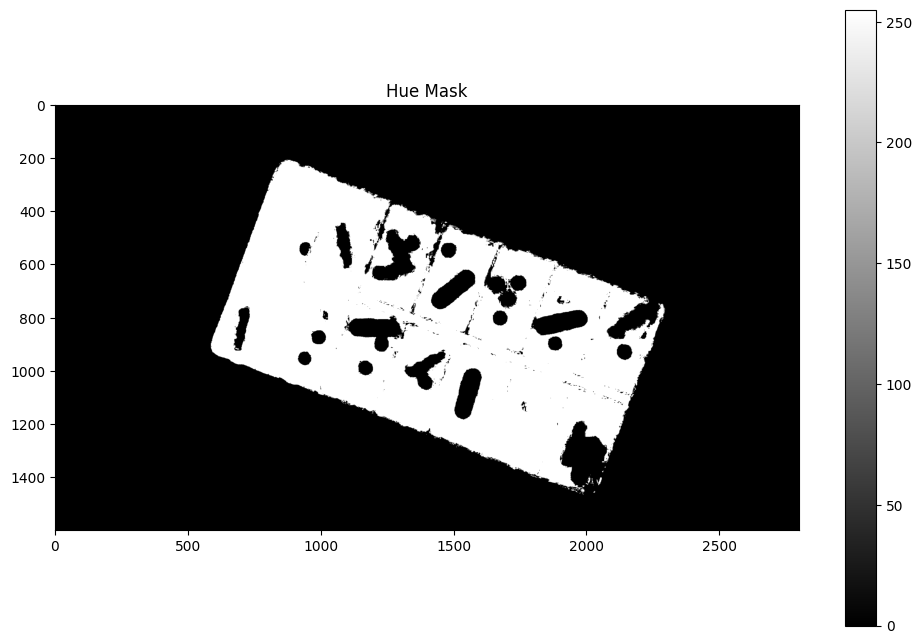

Number of contours detected: 1


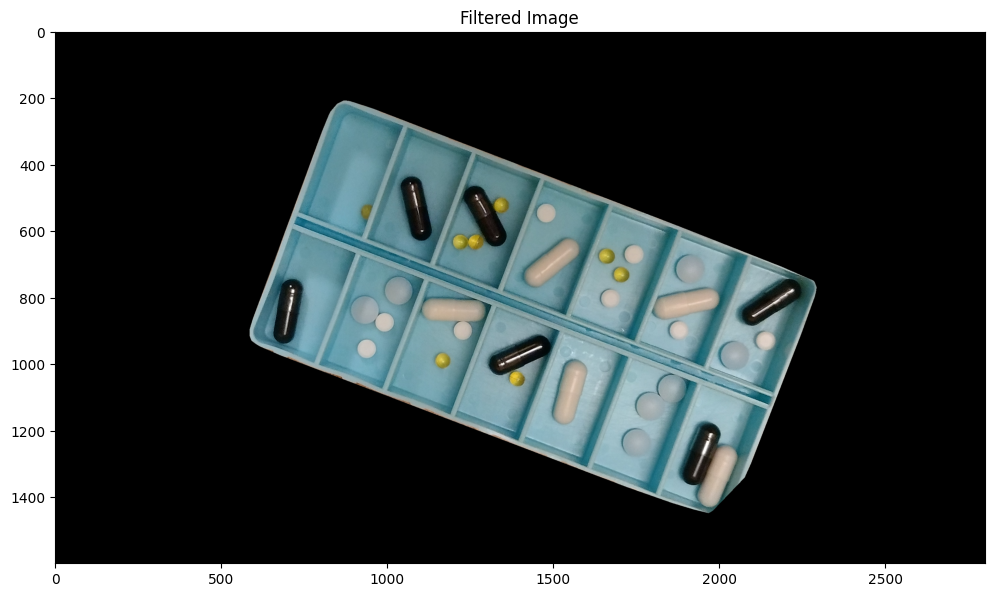

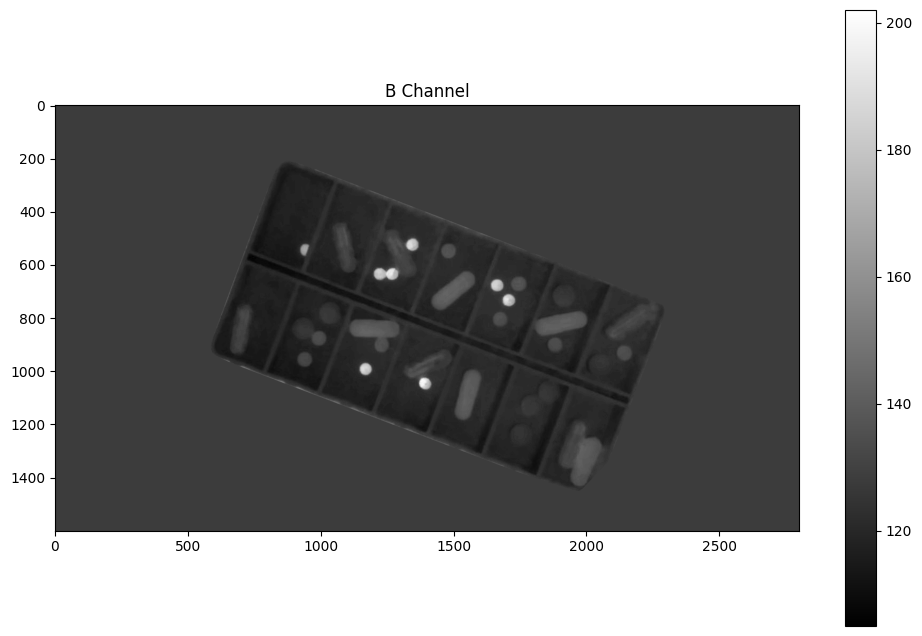

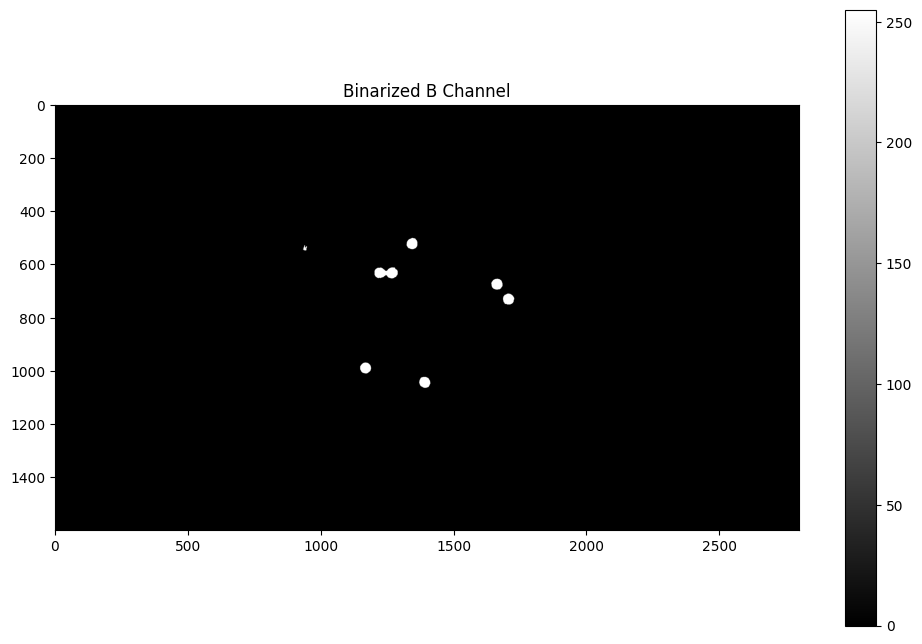

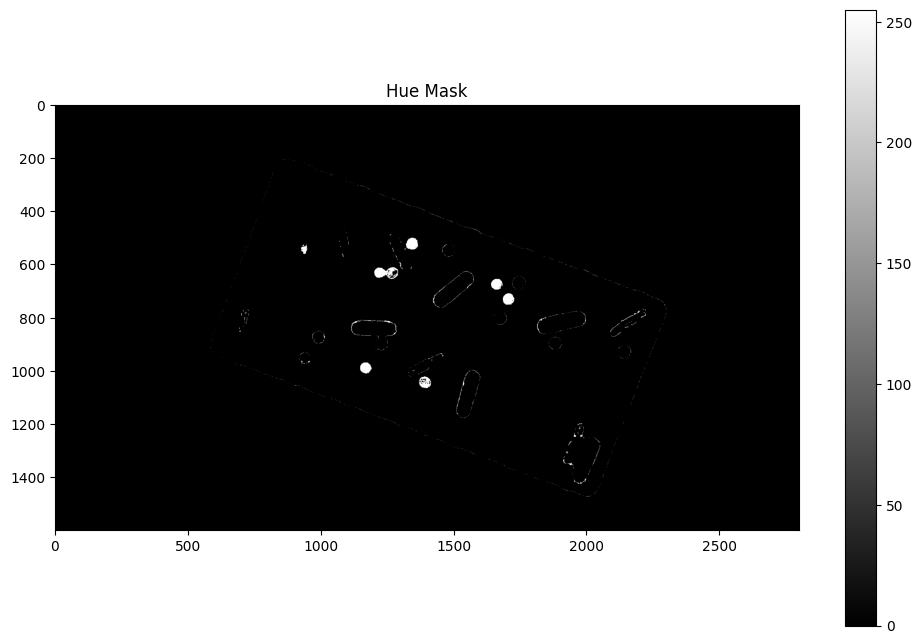

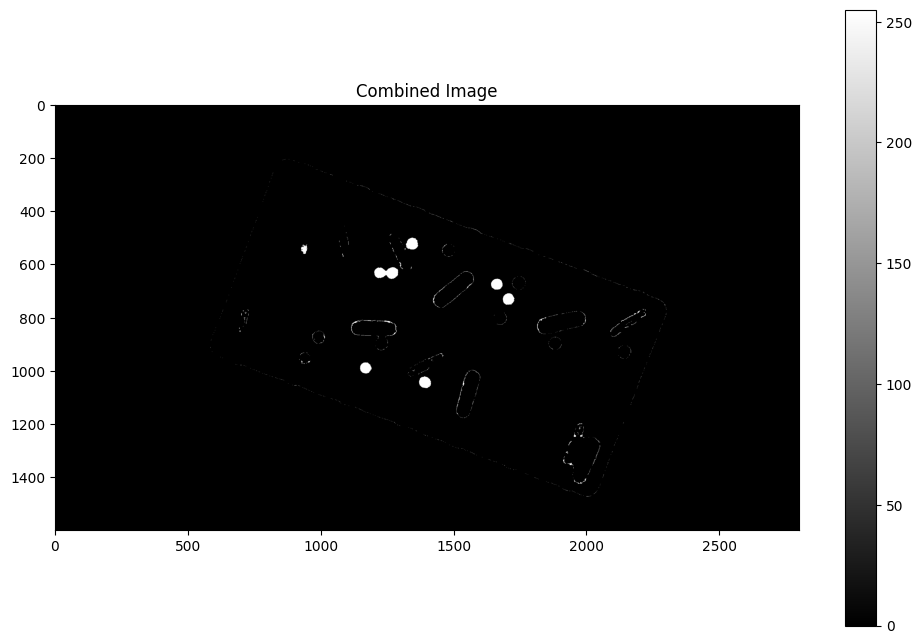

...

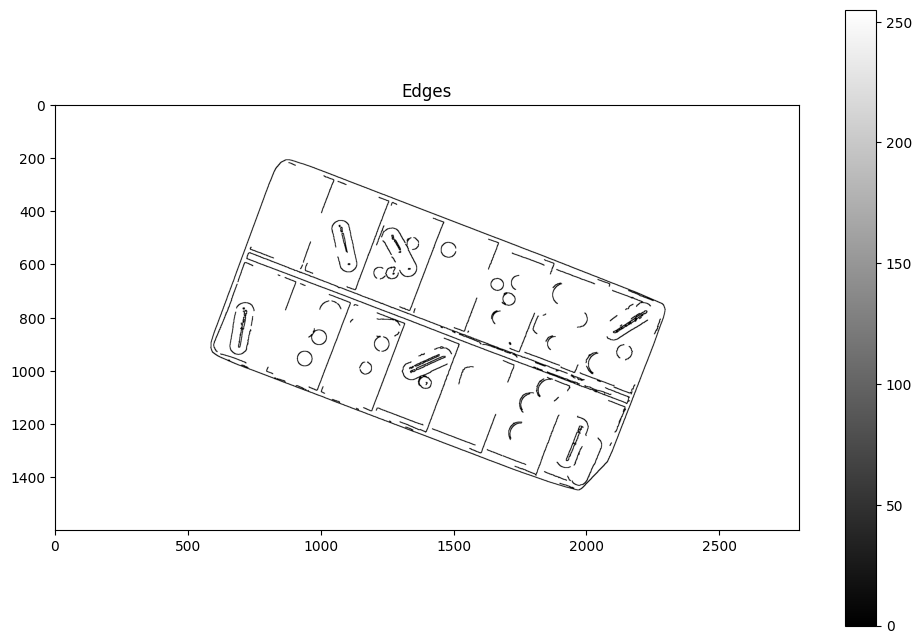

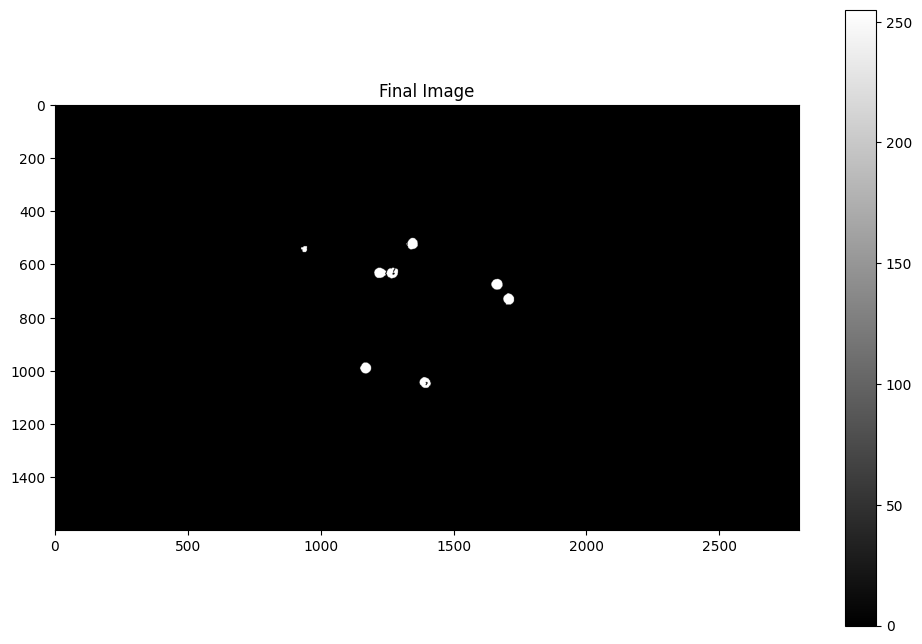

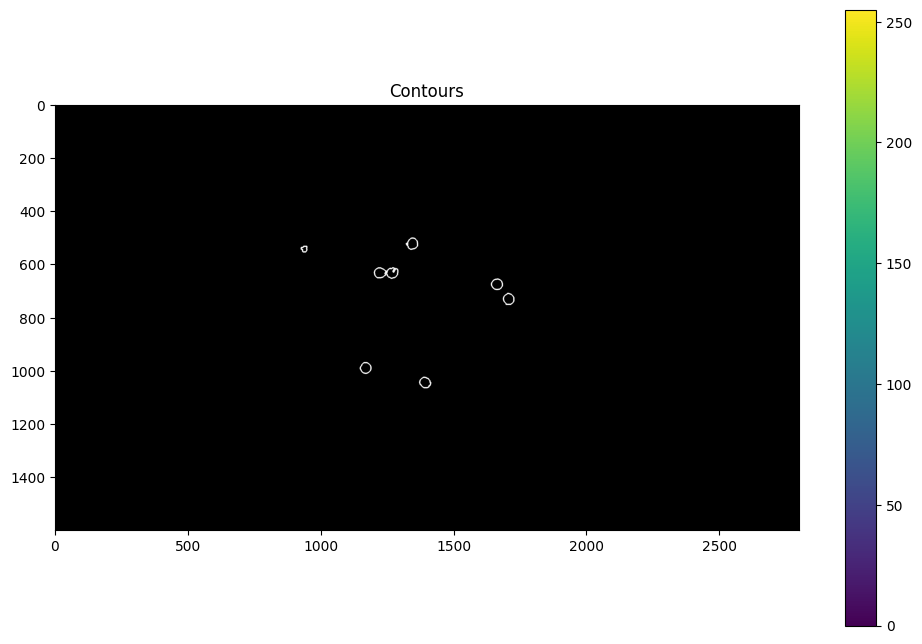

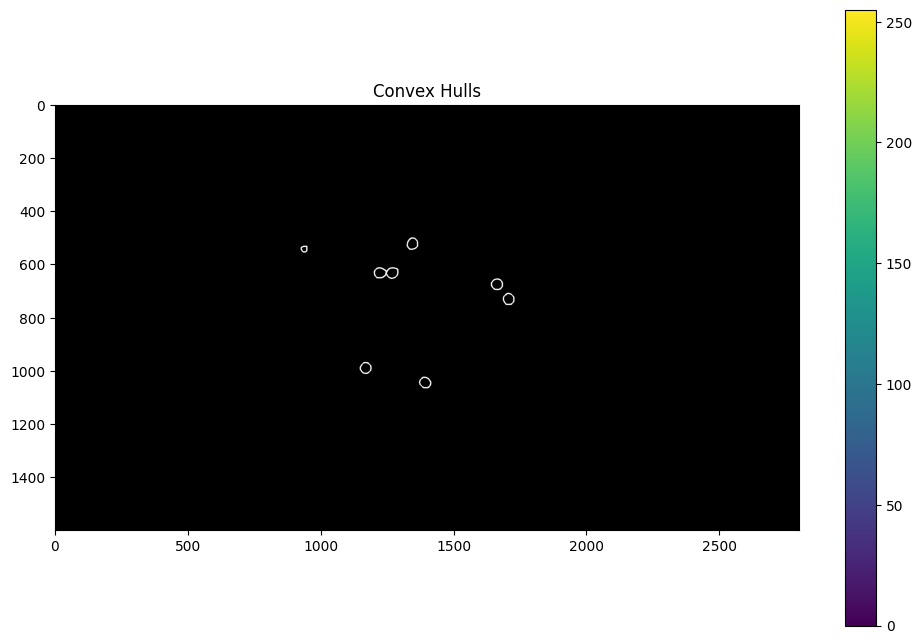

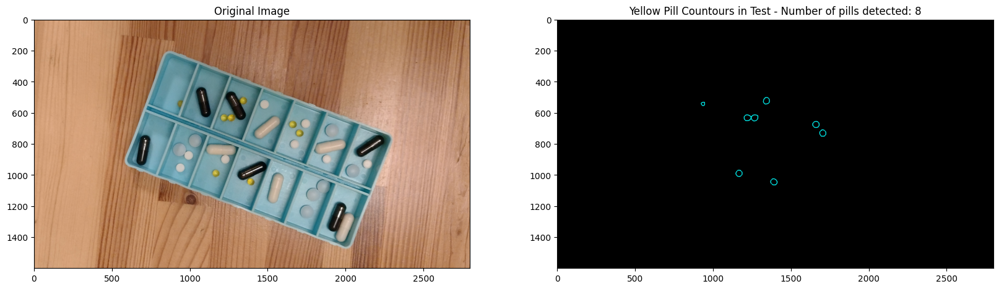

In [164]:
calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")




# yellow pills
yellow_calib, yellow_pill_counturs_calib = process_pills(
    calib, yellow_pills_binarizer, "Yellow Pill Countours in Calib"
)
yellow_test, yellow_pill_counturs_test = process_pills(
    test, yellow_pills_binarizer, "Yellow Pill Countours in Test"
)

# Blue pills

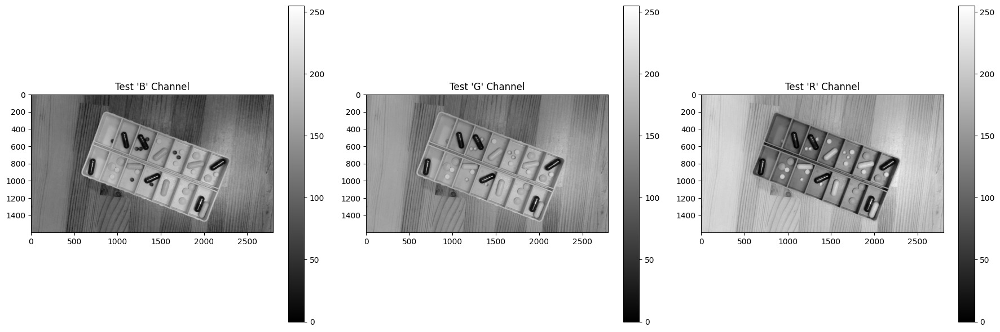

In [166]:
#show test.png in rgb each channel

test = cv2.imread("./Lab5_dane/test.png")
test_b = test[..., 0]
test_g = test[..., 1]
test_r = test[..., 2]

plt.figure(figsize=(18, 6))
plt.subplot(131)
plt.imshow(test_b, cmap='gray')
plt.title("Test 'B' Channel")
plt.colorbar()

plt.subplot(132)
plt.imshow(test_g, cmap='gray')
plt.title("Test 'G' Channel")
plt.colorbar()

plt.subplot(133)
plt.imshow(test_r, cmap='gray')
plt.title("Test 'R' Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

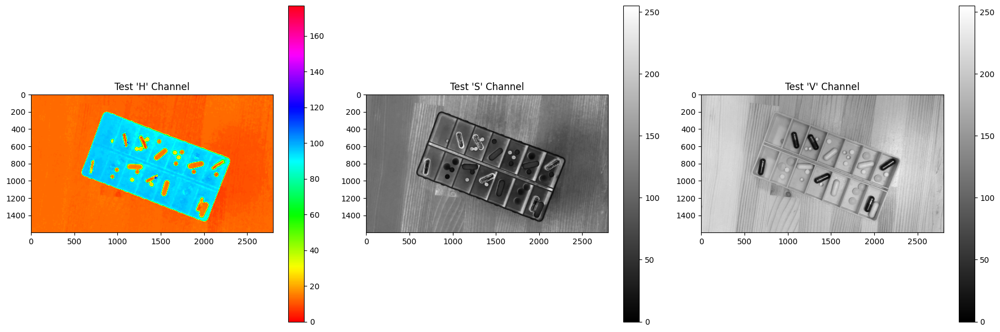

In [167]:
# Convert the test image to HSV color space
test_hsv = cv2.cvtColor(test, cv2.COLOR_BGR2HSV)

# Extract the H, S, and V channels
test_hue = test_hsv[:, :, 0]
test_saturation = test_hsv[:, :, 1]
test_value = test_hsv[:, :, 2]

# Display the H, S, and V channels
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(test_hue, cmap='hsv')
plt.title("Test 'H' Channel")
plt.colorbar()

plt.subplot(132)
plt.imshow(test_saturation, cmap='gray')
plt.title("Test 'S' Channel")
plt.colorbar()

plt.subplot(133)
plt.imshow(test_value, cmap='gray')
plt.title("Test 'V' Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

In [183]:
def blue_pills_binarizer(image: np.ndarray, display: bool = False) -> List[np.ndarray]:
    # Convert the image to HSV color space
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the lower and upper bounds for the S channel
    s_lower_bound = 0
    s_upper_bound = 28

    # Create a binary mask for S channel values between 0 and 30
    s_channel = image_hsv[:, :, 1]
    binary_mask_s = cv2.inRange(s_channel, s_lower_bound, s_upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_s, cmap="gray")
        plt.title("Binary Mask for S Channel (0 to 30)")
        plt.colorbar()
        plt.show()

    # Define the lower and upper bounds for the H channel
    h_lower_bound = 90
    h_upper_bound = 120

    # Create a binary mask for H channel values between 90 and 120
    h_channel = image_hsv[:, :, 0]
    binary_mask_h = cv2.inRange(h_channel, h_lower_bound, h_upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_h, cmap="gray")
        plt.title("Binary Mask for H Channel (90 to 120)")
        plt.colorbar()
        plt.show()

    # Combine the masks using bitwise AND
    combined_mask = cv2.bitwise_and(binary_mask_s, binary_mask_h)

    # make a canny edge detection
    blur = cv2.GaussianBlur(image, (5, 5), 0)
    edges = cv2.Canny(blur, 100, 150)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(edges, cmap="gray")
        plt.title("Edges detected using Canny filter")
        plt.colorbar()
        plt.show()

    # Apply bitwise AND operation with the edges
    edges = cv2.bitwise_not(edges)

    combined_mask = cv2.bitwise_and(combined_mask, edges)


    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap="gray")
        plt.title("Combined Binary Mask for S (0 to 30) and H (90 to 120) Channels")
        plt.colorbar()
        plt.show()

    # Apply erosion to the combined mask
    kernel = np.ones((7, 7), np.uint8)
    eroded_mask = cv2.erode(combined_mask, kernel, iterations=1)

    # Find contours in the eroded mask
    contours, _ = cv2.findContours(eroded_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours by area
    filtered_contours = [contour for contour in contours if cv2.contourArea(contour) > 1000]

    if display:
        contour_image = np.zeros_like(eroded_mask)
        cv2.drawContours(contour_image, filtered_contours, -1, (255, 255, 255), 2)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap="gray")
        plt.title("Filtered Contours")
        plt.colorbar()
        plt.show()

    # Map contours to convex hulls
    convex_hulls = [cv2.convexHull(contour) for contour in filtered_contours]

    if display:
        hull_image = np.zeros_like(eroded_mask)
        cv2.drawContours(hull_image, convex_hulls, -1, (255, 255, 255), 2)
        plt.figure(figsize=(12, 8))
        plt.imshow(hull_image, cmap="gray")
        plt.title("Convex Hulls")
        plt.colorbar()
        plt.show()

    return convex_hulls


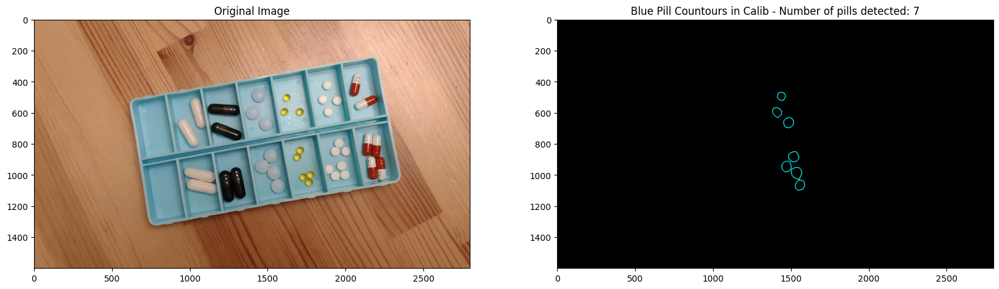

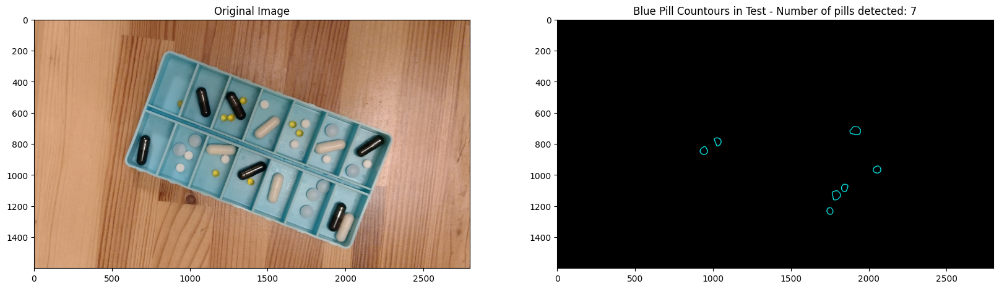

In [186]:
calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")

# blue pills for calib
blue_calib, blue_pill_counturs_calib = process_pills(
    calib, blue_pills_binarizer, "Blue Pill Countours in Calib", False
)

# blue pills for test
blue_test, blue_pill_counturs_test = process_pills(
    test, blue_pills_binarizer, "Blue Pill Countours in Test", False
)

Number of blue pills detected: 7


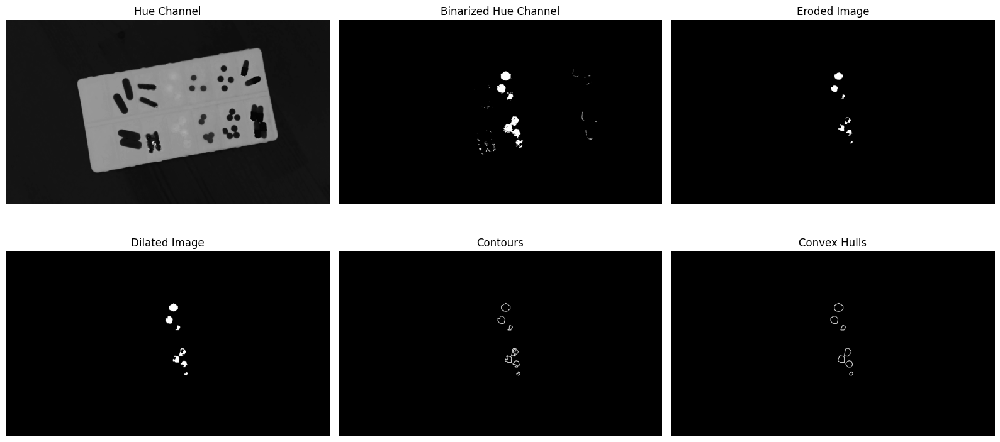

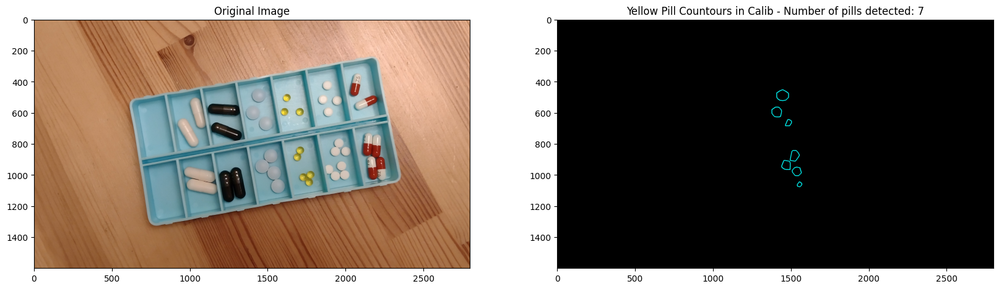

Number of blue pills detected: 3


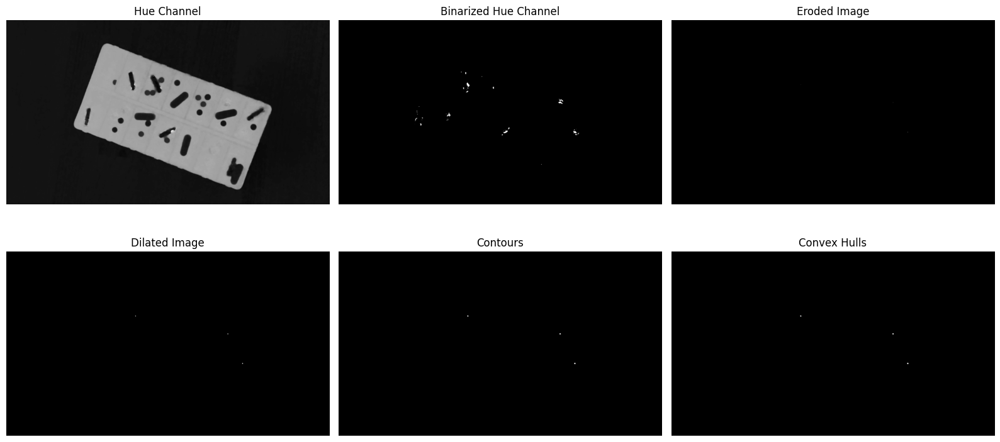

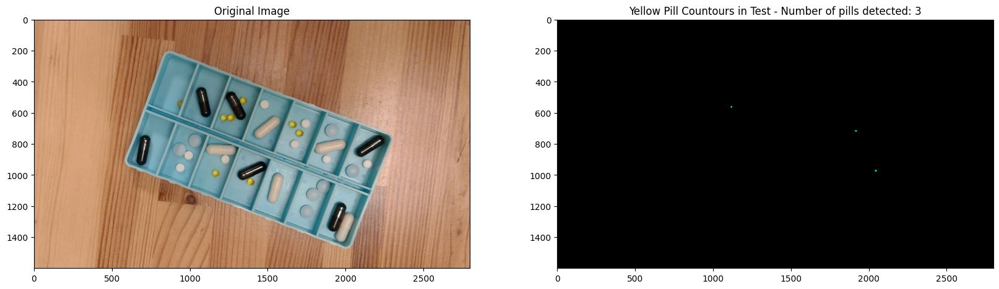

In [165]:
def blue_pills_binarizer(image: np.ndarray, display: bool = False) -> np.ndarray:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # add blur
    image = cv2.GaussianBlur(image, (9, 9), 0)

    if display:
        fig, ax = plt.subplots(2, 3, figsize=(16, 8))

    # Extract the 'H' channel from the HSV image
    h_channel = image[..., 0]
    if display:
        ax[0, 0].imshow(h_channel, cmap="gray")
        ax[0, 0].set_title("Hue Channel")
        ax[0, 0].axis('off')

    # Apply thresholding
    lower_bound = 100
    upper_bound = 118

    # Create a binary mask for hue values between 20 and 40
    binary_mask = cv2.inRange(h_channel, lower_bound, upper_bound)

    if display:
        ax[0, 1].imshow(binary_mask, cmap="gray")
        ax[0, 1].set_title("Binarized Hue Channel")
        ax[0, 1].axis('off')

    # Apply erosion
    erosion_kernel = np.ones((7, 7), np.uint8)
    image = cv2.erode(binary_mask, erosion_kernel, iterations=2)

    if display:
        ax[0, 2].imshow(image, cmap="gray")
        ax[0, 2].set_title("Eroded Image")
        ax[0, 2].axis('off')

    # Apply dilation
    dilation_kernel = np.ones((5, 5), np.uint8)
    image = cv2.dilate(image, dilation_kernel, iterations=1)

    if display:
        ax[1, 0].imshow(image, cmap="gray")
        ax[1, 0].set_title("Dilated Image")
        ax[1, 0].axis('off')

    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)
        ax[1, 1].imshow(contour_image, cmap="gray")
        ax[1, 1].set_title("Contours")
        ax[1, 1].axis('off')

    print(f"Number of blue pills detected: {len(contours)}")

    # apply convex hull
    convex_hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        convex_hulls.append(hull)

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)
        ax[1, 2].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
        ax[1, 2].set_title("Convex Hulls")
        ax[1, 2].axis('off')
        plt.tight_layout()
        plt.show()

    return convex_hulls

calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")


# black pills for calib
def process_pills(img, binarizer_function, title):
    processed_img = np.zeros_like(img)
    pill_contours = binarizer_function(img, True)
    cv2.drawContours(processed_img, pill_contours, -1, (255, 255, 0), 3)

    # show original and processed images in rgb
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")

    ax[1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
    ax[1].set_title(title + f" - Number of pills detected: {len(pill_contours)}")

    plt.show()
    return processed_img, pill_contours

# yellow pills
blue_calib, blie_pill_counturs_calib = process_pills(
    calib, blue_pills_binarizer, "Yellow Pill Countours in Calib"
)
blue_test, blue_pill_counturs_test = process_pills(
    test, blue_pills_binarizer, "Yellow Pill Countours in Test")

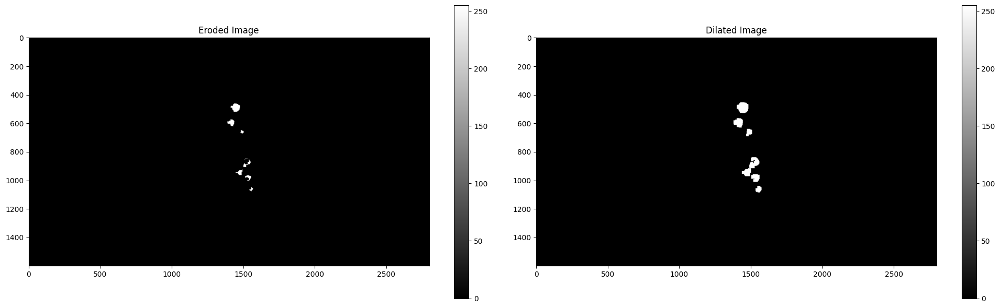

In [258]:
calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
calib_hue = calib_hsv[:, :, 0]

# Define the hue range for binarization
lower_bound = 100
upper_bound = 118

# Create a binary mask for hue values between 20 and 40
binary_mask = cv2.inRange(calib_hue, lower_bound, upper_bound)

# use erode and dilate to remove noise

# Apply erosion
erosion_kernel = np.ones((7, 7), np.uint8)
eroded_image = cv2.erode(binary_mask, erosion_kernel, iterations=2)

# Apply dilation
dilation_kernel = np.ones((5, 5), np.uint8)
dilated_image = cv2.dilate(eroded_image, dilation_kernel, iterations=4)

# Display the eroded and dilated images
plt.figure(figsize=(20, 6))
plt.subplot(121)
plt.imshow(eroded_image, cmap='gray')
plt.title("Eroded Image")
plt.colorbar()

plt.subplot(122)
plt.imshow(dilated_image, cmap='gray')
plt.title("Dilated Image")
plt.colorbar()

plt.tight_layout()
plt.show()

# BIG WHITE PILLS

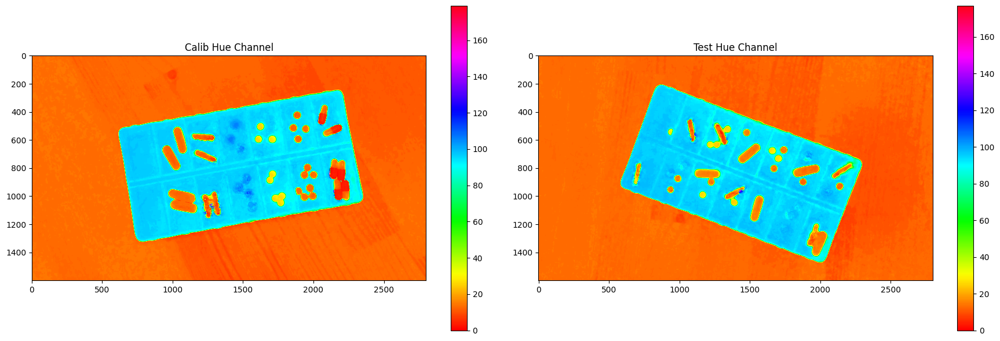

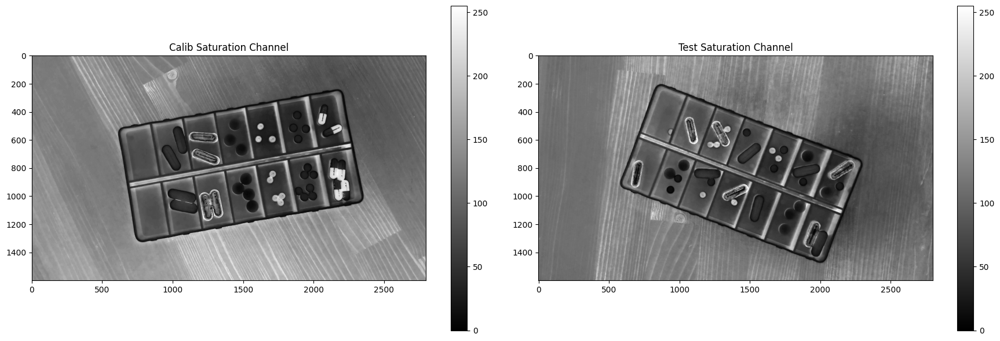

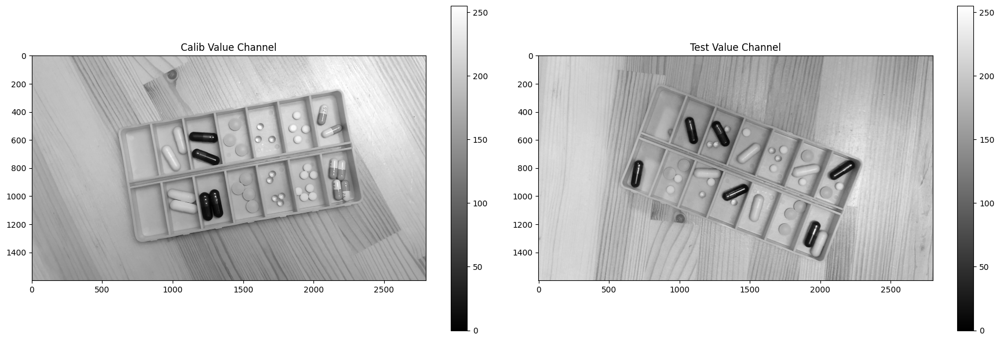

In [190]:
# Convert the calib and test images to HSV color space
calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")

calib_hsv = cv2.cvtColor(calib, cv2.COLOR_BGR2HSV)
test_hsv = cv2.cvtColor(test, cv2.COLOR_BGR2HSV)

# Extract the hue channel from both images
calib_hue = calib_hsv[:, :, 0]
test_hue = test_hsv[:, :, 0]

# Display the hue channels
plt.figure(figsize=(18, 6))

plt.subplot(121)
plt.imshow(calib_hue, cmap='hsv')
plt.title("Calib Hue Channel")
plt.colorbar()

plt.subplot(122)
plt.imshow(test_hue, cmap='hsv')
plt.title("Test Hue Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

# show saturation channel for calib and test
calib_saturation = calib_hsv[:, :, 1]
test_saturation = test_hsv[:, :, 1]

plt.figure(figsize=(18, 6))

plt.subplot(121)
plt.imshow(calib_saturation, cmap='gray')
plt.title("Calib Saturation Channel")
plt.colorbar()

plt.subplot(122)
plt.imshow(test_saturation, cmap='gray')
plt.title("Test Saturation Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

# show value channel for calib and test
calib_value = calib_hsv[:, :, 2]
test_value = test_hsv[:, :, 2]

plt.figure(figsize=(18, 6))

plt.subplot(121)
plt.imshow(calib_value, cmap='gray')
plt.title("Calib Value Channel")
plt.colorbar()

plt.subplot(122)
plt.imshow(test_value, cmap='gray')
plt.title("Test Value Channel")
plt.colorbar()

plt.tight_layout()
plt.show()

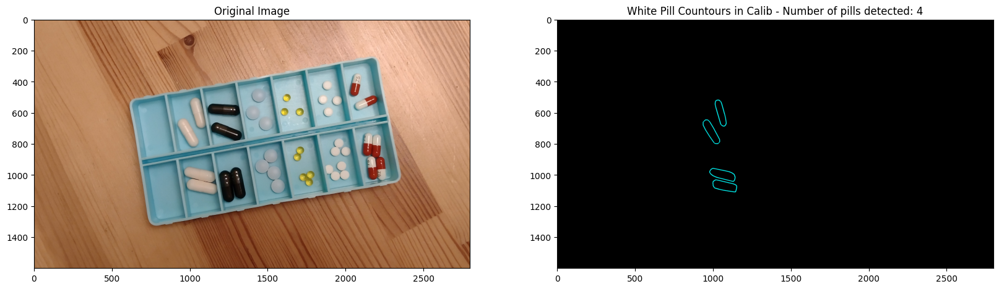

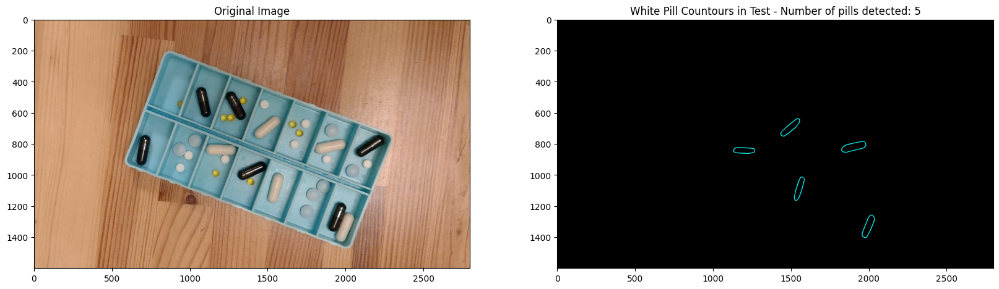

In [31]:
def white_pills_binarize(image: np.ndarray, display: bool = False) -> np.ndarray:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    image_h = image[..., 0]
    lower_hue_bound = 8
    upper_hue_bound = 18

    # Create a binary mask for hue values between 20 and 40
    binary_mask_h = cv2.inRange(image_h, lower_hue_bound, upper_hue_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_h, cmap='gray')
        plt.title("Binarized Hue Channel")
        plt.colorbar()
        plt.show()

    image_s = image[..., 1]
    lower_saturation_bound = 0
    upper_saturation_bound = 65

    # Create a binary mask for hue values between 20 and 40
    binary_mask_s = cv2.inRange(image_s, lower_saturation_bound, upper_saturation_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_s, cmap='gray')
        plt.title("Binarized Saturation Channel")
        plt.colorbar()
        plt.show()

    image_v = image[..., 2]
    lower_value_bound = 150
    upper_value_bound = 255

    # Create a binary mask for hue values between 20 and 40
    binary_mask_v = cv2.inRange(image_v, lower_value_bound, upper_value_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_v, cmap='gray')
        plt.title("Binarized Value Channel")
        plt.colorbar()
        plt.show()

    # Combine the masks using bitwise AND

    combined_mask = cv2.bitwise_and(binary_mask_h, binary_mask_v)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap='gray')
        plt.title("Combined Binary Mask h i v")
        plt.colorbar()
        plt.show()

    combined_mask = cv2.bitwise_and(combined_mask, binary_mask_s)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap='gray')
        plt.title("Combined Binary Mask h i v s")
        plt.colorbar()
        plt.show()


    # Apply erosion
    erosion_kernel = np.ones((7, 7), np.uint8)
    image = cv2.erode(combined_mask, erosion_kernel, iterations=2)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap='gray')
        plt.title("Eroded Image")
        plt.colorbar()
        plt.show()

    # Apply dilation
    dilation_kernel = np.ones((3, 3), np.uint8)
    image = cv2.dilate(image, dilation_kernel, iterations=1)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap='gray')
        plt.title("Dilated Image")
        plt.colorbar()
        plt.show()

    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap='gray')
        plt.title("Contours")
        plt.colorbar()
        plt.show()

    # Convex hull

    convex_hulls = [cv2.convexHull(contour) for contour in contours]

    # filter contours by area
    convex_hulls = [hull for hull in convex_hulls if cv2.contourArea(hull) > 2500]

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap='gray')
        plt.title("Convex Hulls")
        plt.colorbar()
        plt.show()


    return convex_hulls



calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")

# white pills for calib
white_calib, white_pill_counturs_calib = process_pills(
    calib, white_pills_binarize, "White Pill Countours in Calib",  False
)

# white pills for test
white_test, white_pill_counturs_test = process_pills(
    test, white_pills_binarize, "White Pill Countours in Test", False
)

# Small White Pills

Number of contours detected: 1


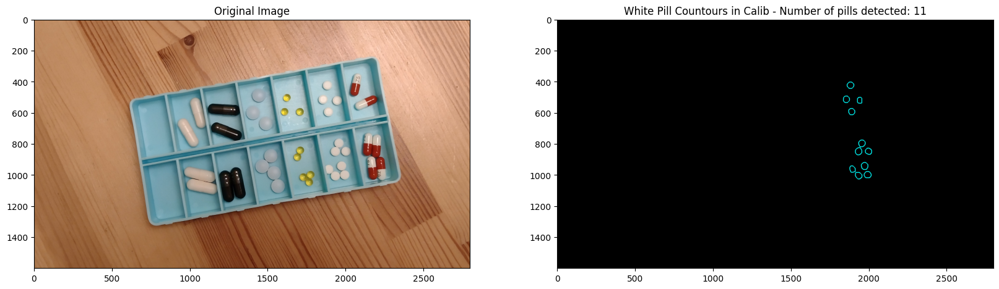

Number of contours detected: 1


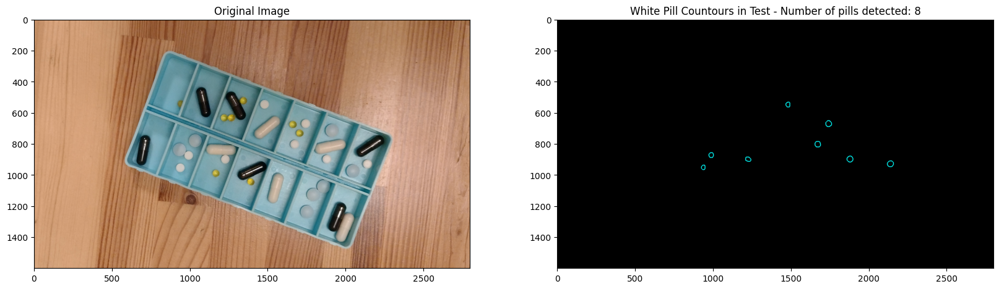

In [24]:
def small_white_pills_binarize(image: np.ndarray, display: bool = False) -> np.ndarray:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    image_h = image[..., 0]
    # Define the hue range for binarization
    lower_bound = 90
    upper_bound = 110
    # Create a binary mask for hue values between 90 and 110
    hue_mask = cv2.inRange(image_h, lower_bound, upper_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(hue_mask, cmap="gray")
        plt.title("Hue Mask")
        plt.colorbar()
        plt.show()

    # Find contours
    contours, _ = cv2.findContours(hue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # filter contours by area

    contours = [contour for contour in contours if cv2.contourArea(contour) > 1000]

    print(f"Number of contours detected: {len(contours)}")

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)

    # Convex hull
    convex_hulls = [cv2.convexHull(contour) for contour in contours]

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)

    # all pixels outside the convex hull are set to 0
    mask = np.zeros_like(image)
    cv2.drawContours(mask, convex_hulls, -1, (255, 255, 255), -1)

    image = cv2.bitwise_and(image, mask)

    # print img color model

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image[..., ::-1])
        plt.title("Filtered Image")
        plt.show()

    image_h = image[..., 0]

    lower_hue_bound = 8
    upper_hue_bound = 18

    # Create a binary mask for hue values between 20 and 40
    binary_mask_h = cv2.inRange(image_h, lower_hue_bound, upper_hue_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_h, cmap="gray")
        plt.title("Binarized Hue Channel")
        plt.colorbar()
        plt.show()

    image_s = image[..., 1]
    lower_saturation_bound = 0
    upper_saturation_bound = 65

    # Create a binary mask for hue values between 20 and 40
    binary_mask_s = cv2.inRange(image_s, lower_saturation_bound, upper_saturation_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_s, cmap="gray")
        plt.title("Binarized Saturation Channel")
        plt.colorbar()
        plt.show()

    image_v = image[..., 2]
    lower_value_bound = 150
    upper_value_bound = 255

    # Create a binary mask for hue values between 20 and 40
    binary_mask_v = cv2.inRange(image_v, lower_value_bound, upper_value_bound)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(binary_mask_v, cmap="gray")
        plt.title("Binarized Value Channel")
        plt.colorbar()
        plt.show()

    # Combine the masks using bitwise AND

    combined_mask = cv2.bitwise_and(binary_mask_h, binary_mask_v)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap="gray")
        plt.title("Combined Binary Mask h i v")
        plt.colorbar()
        plt.show()

    combined_mask = cv2.bitwise_and(combined_mask, binary_mask_s)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap="gray")
        plt.title("Combined Binary Mask h i v s")
        plt.colorbar()
        plt.show()

    # detect edges
    blur = cv2.GaussianBlur(image, (5, 5), 0)
    edges = cv2.Canny(blur, 100, 150)

    # dilation
    dilation_kernel = np.ones((5, 5), np.uint8)
    edges = cv2.dilate(edges, dilation_kernel, iterations=1)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(edges, cmap="gray")
        plt.title("Edges detected using Canny filter")
        plt.colorbar()
        plt.show()

    # Apply bitwise AND operation with the edges
    edges = cv2.bitwise_not(edges)

    combined_mask = cv2.bitwise_and(combined_mask, edges)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(combined_mask, cmap="gray")
        plt.title("Combined Binary Mask with Edges")
        plt.colorbar()
        plt.show()

    # Apply erosion
    erosion_kernel = np.ones((7, 7), np.uint8)
    image = cv2.erode(combined_mask, erosion_kernel, iterations=2)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Eroded Image")
        plt.colorbar()
        plt.show()

    # Apply dilation
    dilation_kernel = np.ones((5, 5), np.uint8)
    image = cv2.dilate(image, dilation_kernel, iterations=2)

    if display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image, cmap="gray")
        plt.title("Dilated Image")
        plt.colorbar()
        plt.show()

    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if display:
        for contour in contours:
          print(cv2.contourArea(contour))

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, contours, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap="gray")
        plt.title("Contours")
        plt.colorbar()
        plt.show()

    # Convex hull

    convex_hulls = [cv2.convexHull(contour) for contour in contours]

    # filter contours by area
    convex_hulls = [hull for hull in convex_hulls if 240 < cv2.contourArea(hull) < 1700]

    # print every area of convex hull
    if display:
        for hull in convex_hulls:
            print(cv2.contourArea(hull))

    if display:
        contour_image = np.zeros_like(image)
        cv2.drawContours(contour_image, convex_hulls, -1, (255, 255, 0), 3)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap="gray")
        plt.title("Convex Hulls")
        plt.colorbar()
        plt.show()

    symmetry_tolerance = 1.5
    ellipses = []
    filtered_hulls =[]
    for i, contour in enumerate(convex_hulls):
        if len(contour) >= 5:  # fitEllipse requires at least 5 points
            # Extract the major and minor axes lengths
            ellipse = cv2.fitEllipse(contour)
            (x, y), (major_axis, minor_axis), angle = ellipse

            # Calculate the axis ratio
            axis_ratio = max(major_axis, minor_axis) / min(major_axis, minor_axis)

            # Filter ellipses that are close to circular based on symmetry tolerance
            if axis_ratio < symmetry_tolerance:
                ellipses.append(ellipse)
                filtered_hulls.append(contour)

    if display:
        contour_image = np.zeros_like(image)
        for ellipse in ellipses:
            cv2.ellipse(contour_image, ellipse, (255, 255, 0), 2)
        plt.figure(figsize=(12, 8))
        plt.imshow(contour_image, cmap="gray")
        plt.title("Fitted Ellipses")
        plt.colorbar()
        plt.show()

    return filtered_hulls


calib = cv2.imread("./Lab5_dane/calib.png")
test = cv2.imread("./Lab5_dane/test.png")

# white pills for calib
white_calib, white_pill_counturs_calib = process_pills(
    calib, small_white_pills_binarize, "White Pill Countours in Calib", False
)

# white pills for test
white_test, white_pill_counturs_test = process_pills(
    test, small_white_pills_binarize, "White Pill Countours in Test", False
)